<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I2wUTT12p5bX3RCku_T_82aD4tkY9LVY" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов.

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?




---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>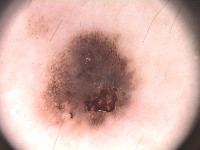</td><td>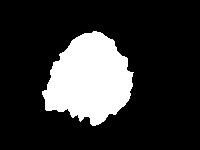</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [ ]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

# если по ссылке слишком много запросов, датасет можно скачать с kaggle: https://www.kaggle.com/datasets/kanametov/ph2dataset

--2023-12-09 19:13:21--  https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:6031:18::a27d:5112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/8lqrloi0mxj2acu/PH2Dataset.rar [following]
--2023-12-09 19:13:21--  https://www.dropbox.com/s/raw/8lqrloi0mxj2acu/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8d18d783cea22dffd54261aa95.dl.dropboxusercontent.com/cd/0/inline/CJF8G40yxSmRI-tEAb7LAxZ3aV_Nvx9RqZesTO6BvTe5KfFBrgOHPierK5PLjnL09jKfBumZtNyWCIfR1zLHFOi7_pe-Sdlqrbu6U5ZJ7LlJ7e-C_MHC4zWbSF6jQBMguG4/file# [following]
--2023-12-09 19:13:22--  https://uc8d18d783cea22dffd54261aa95.dl.dropboxusercontent.com/cd/0/inline/CJF8G40yxSmRI-tEAb7LAxZ3aV_Nvx9RqZesTO6BvTe5KfFBrgOHPierK5PLjnL09jKfBumZtNyWCIfR1zLHFOi7_pe-Sdlqrbu6U5ZJ7LlJ7e-C_M

In [ ]:
!ls

PH2Dataset.rar	sample_data


In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [ ]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [ ]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [ ]:
len(lesions)

200

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

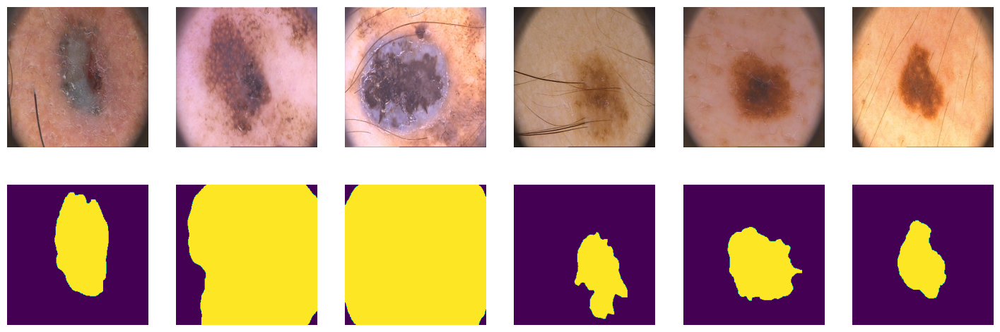

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [ ]:
from torch.utils.data import DataLoader
batch_size = 10
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [ ]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

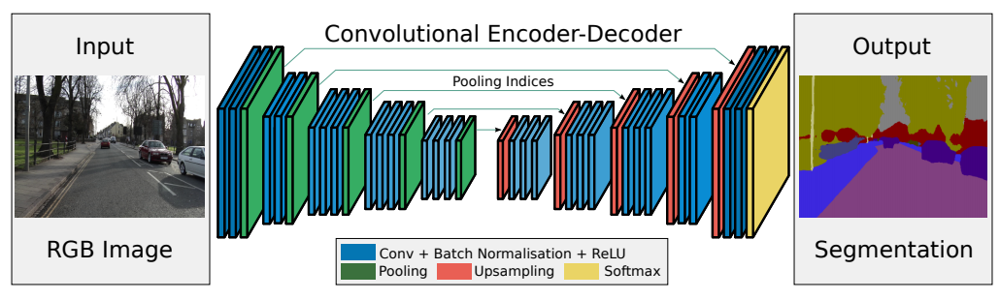

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Так как согласно [документации](https://arxiv.org/pdf/1511.00561.pdf) Segnet состоит из 13 сверточных слоев (кодировщиков), которые соответствуют первым 13 сверточным слоям в сети [VGG16](https://arxiv.org/abs/1409.1556), то просто просмотрим их и перенесем архитектуру в наш `class SegNet`.

In [ ]:
import torchvision.models as models

vgg16 = models.vgg16(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 163MB/s]


In [ ]:
vgg16.to(device)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2) # 16 -> 8 - this is the bottleneck

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=2, stride=2) # 8 -> 16
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )
        self.upsample1 = nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=2, stride=2) # 16 -> 32
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.upsample2 = nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=2, stride=2)  # 32 -> 64
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.upsample3 = nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=2, stride=2)  # 64 -> 128
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.upsample4 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=2, stride=2)  # 128 -> 256
        self.dec_conv4 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, padding=1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)
        p4 = self.pool4(b)

        # decoder
        u0 = self.upsample0(p4)
        d0 = self.dec_conv0(u0)
        u1 = self.upsample1(d0)
        d1 = self.dec_conv1(u1)
        u2 = self.upsample2(d1)
        d2 = self.dec_conv2(u2)
        u3 = self.upsample3(d2)
        d3 = self.dec_conv3(u3)
        u4 = self.upsample4(d3)
        d4 = self.dec_conv4(u4)  # no activation
        return d4

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0

    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds

    return thresholded  #

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации.

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

### loss function: bce

In [ ]:
def bce_loss(y_real, y_pred):
    y_pred = torch.sigmoid(y_pred) # TODO
    return torch.mean(y_pred - torch.mul(y_pred, y_real) + torch.log(1 + torch.exp(-y_pred))) # please don't use nn.BCELoss. write it from scratch

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [ ]:
def train(model, opt, loss_fn, epochs, data_tr, data_val, scheduler=None):
    X_val, Y_val = next(iter(data_val))
    train_loss = []
    val_loss = []
    iou_score = []
    valid_loss_min = np.Inf

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device) # data to device

            opt.zero_grad() # set parameter gradients to zero

            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred) # forward-pass
            loss.backward()  # backward-pass
            opt.step()  # update weights

            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
        train_loss.append(avg_loss.item())
        toc = time()
        print('loss: %f' % avg_loss)

        if scheduler is not None:
            scheduler.step(avg_loss)

        # show intermediate results
        model.eval()  # testing mode
        X_val, Y_val = X_val.to(device), Y_val.to(device)
        Y_hat = model(X_val)
        loss = loss_fn(Y_val, Y_hat)
        Y_hat = torch.sigmoid(Y_hat)
        val_loss.append(loss.item()/len(data_val))

        iou = score_model(model, iou_pytorch, data_val)
        iou_score.append(iou)

        print('loss valid: %f' % val_loss[-1])

        # keep the weights of the best model
        if val_loss[-1] <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_loss_min,
            val_loss[-1]))
            torch.save(model.state_dict(), 'model.pt')
            valid_loss_min = val_loss[-1]

        Y_hat, X_val, Y_val = Y_hat.detach().to('cpu'), X_val.to('cpu'), Y_val.to('cpu') # detach and put into cpu

        # Visualize tools
        clear_output(wait=True)
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - loss: %f' % (epoch+1, epochs, avg_loss))
        plt.show()

    # load the model with the best weights
    model.load_state_dict(torch.load('model.pt'))
    print('loading best model state')

    # display the training schedule
    plt.plot(range(epochs), val_loss)
    plt.title('val_loss')
    plt.show()

    plt.plot(range(epochs), train_loss)
    plt.title('train_loss')
    plt.show()

    return val_loss, train_loss, iou_score

## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [ ]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [ X_batch for X_batch, _ in data]
    return np.array(Y_pred)

In [ ]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    with torch.no_grad():
      for X_batch, Y_label in data:
          X_batch = X_batch.to(device)
          Y_label = Y_label.to(device)
          Y_pred = model(X_batch)
          Y_pred = (torch.sigmoid(Y_pred) >= 0.5)
          scores += metric(Y_pred, Y_label.to(device)).mean().item()

    return scores/len(data)

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [ ]:
model = SegNet().to(device)

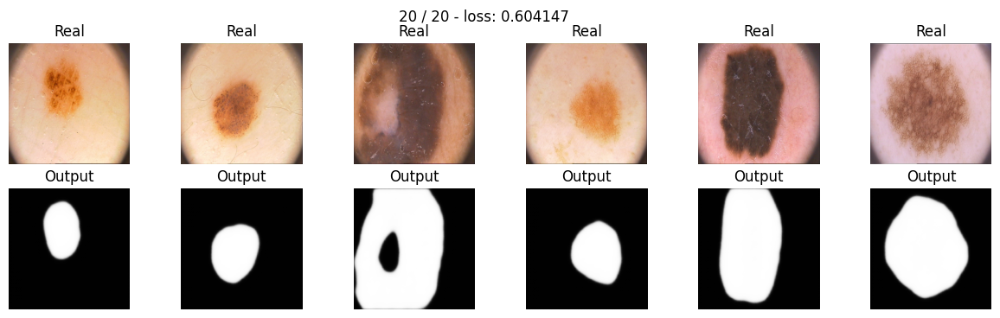

loading best model state


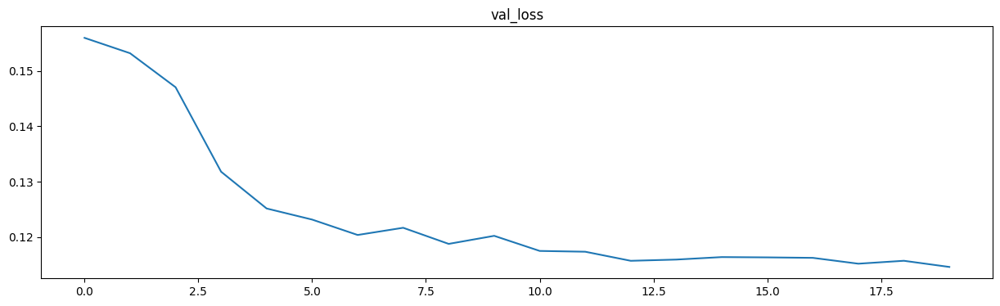

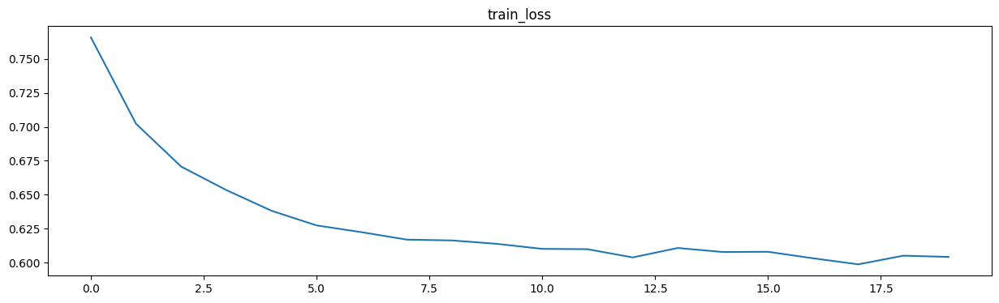

([0.15600019693374634,
  0.15322309732437134,
  0.1470792770385742,
  0.13181370496749878,
  0.12516847848892212,
  0.12316293716430664,
  0.12038086652755738,
  0.12168192863464355,
  0.1187709093093872,
  0.12022594213485718,
  0.11749660968780518,
  0.11735397577285767,
  0.11571295261383056,
  0.11593586206436157,
  0.11638520956039429,
  0.11633068323135376,
  0.11624659299850464,
  0.11518992185592651,
  0.11571838855743408,
  0.11460130214691162],
 [0.7658019065856934,
  0.7022004127502441,
  0.6706744432449341,
  0.6534062027931213,
  0.638156533241272,
  0.627356767654419,
  0.6223499178886414,
  0.6168870329856873,
  0.6162976026535034,
  0.6137793064117432,
  0.6100903153419495,
  0.6098604798316956,
  0.6037852764129639,
  0.6107330322265625,
  0.6077759265899658,
  0.6079289317131042,
  0.6031416654586792,
  0.5986912250518799,
  0.6050854921340942,
  0.6041473150253296],
 [0.0,
  0.0,
  0.008000000566244125,
  0.30000001192092896,
  0.4980000197887421,
  0.338000011444091

In [ ]:
max_epochs = 20
optim = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optim,
    patience=3,
    threshold=1e-4,
    mode="min"
)
train(model, optim, bce_loss, max_epochs, data_tr, data_val, scheduler)

In [ ]:
score_model(model, iou_pytorch, data_val)

0.6300000309944153

Ответьте себе на вопрос: не переобучается ли моя модель?

**Ответ:**

`SegNet` с функцией потерь `bce_loss` на 20-ти эпохах не переобучается.

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла]

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss.
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


### loss function: dice

In [ ]:
def dice_loss(y_real, y_pred):
    y_pred = torch.sigmoid(y_pred)
    num = 1 / 256 * 256
    den = num * (2. * (y_pred * y_real).sum()) / (
        (y_pred + y_real).sum())
    res = 1. - den
    return res

Проводим тестирование:

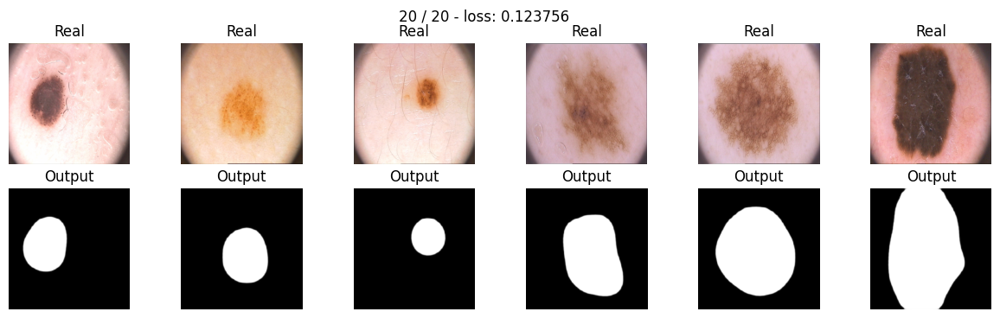

loading best model state


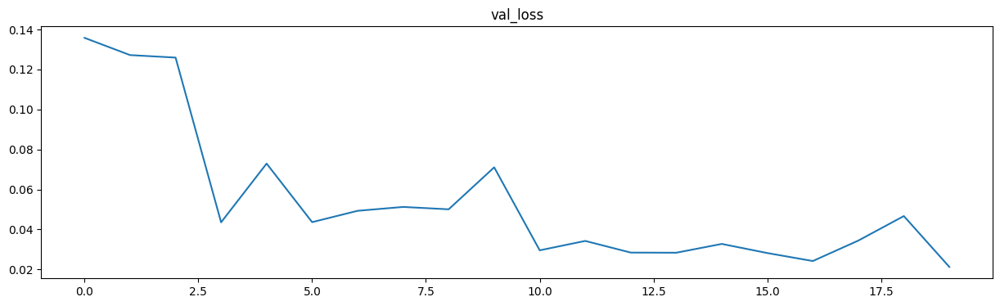

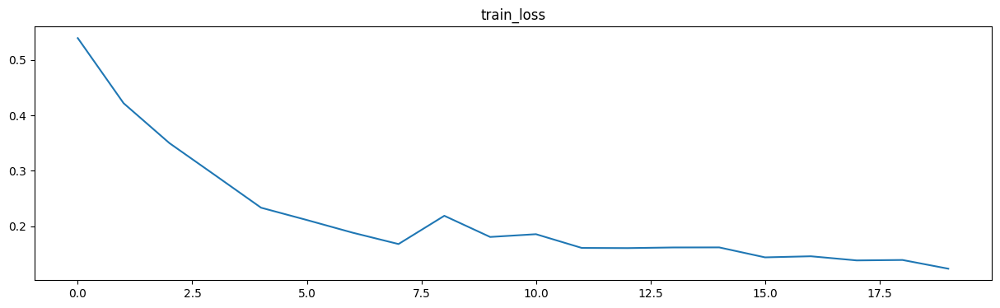

([0.1358076810836792,
  0.12719995975494386,
  0.12594454288482665,
  0.043568873405456544,
  0.07294739484786987,
  0.043656337261199954,
  0.04932507276535034,
  0.05126132965087891,
  0.050077426433563235,
  0.07106629610061646,
  0.02956244945526123,
  0.034264004230499266,
  0.028434157371520996,
  0.0283632755279541,
  0.03276212215423584,
  0.028204727172851562,
  0.024207305908203126,
  0.03443698883056641,
  0.046698999404907224,
  0.021245837211608887],
 [0.5390016436576843,
  0.4217493534088135,
  0.34991323947906494,
  0.29193243384361267,
  0.2336072027683258,
  0.21143248677253723,
  0.1885991096496582,
  0.1681600958108902,
  0.21905313432216644,
  0.18090903759002686,
  0.18590347468852997,
  0.16116070747375488,
  0.16086208820343018,
  0.16199876368045807,
  0.1621064394712448,
  0.1441723257303238,
  0.14614449441432953,
  0.1386914700269699,
  0.13946302235126495,
  0.1237560510635376],
 [0.07000000327825547,
  0.10200000554323196,
  0.10800000876188279,
  0.3380000

In [ ]:
model_dice = SegNet().to(device)

max_epochs = 20
optimaizer = torch.optim.Adam(model_dice.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimaizer,
    patience=3,
    threshold=1e-4,
    mode="min")
train(model_dice, optimaizer, dice_loss, max_epochs, data_tr, data_val, scheduler)

In [ ]:
score_model(model_dice, iou_pytorch, data_val)

0.634000027179718

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


### loss function: focal

In [ ]:
def focal_loss(y_real, y_pred, eps=1e-8, gamma=2):
    y_pred = torch.sigmoid(y_pred) + eps
    y_pred = y_pred.view(-1)
    y_real = y_real.view(-1)
    focal_loss = -((1 - y_pred) ** gamma * y_real * y_pred.log() + (1-y_real)*(1-y_pred).log())
    return focal_loss.mean()


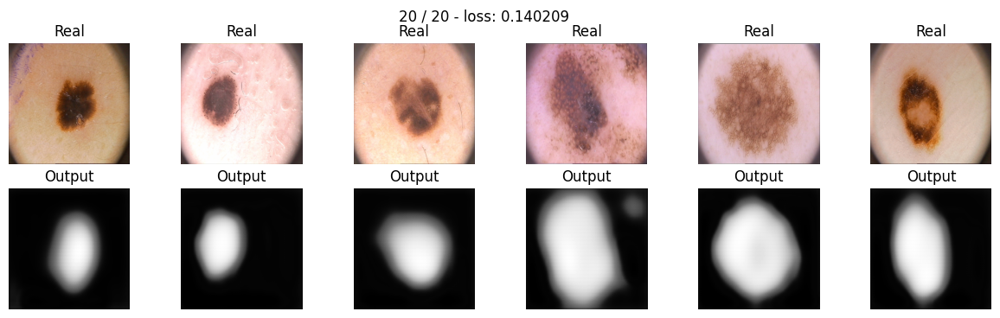

loading best model state


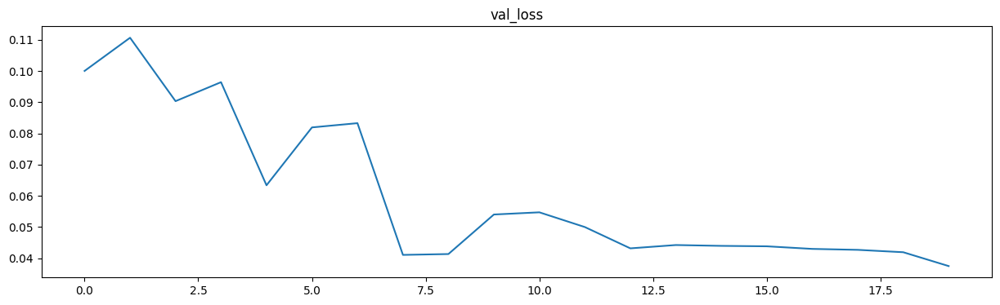

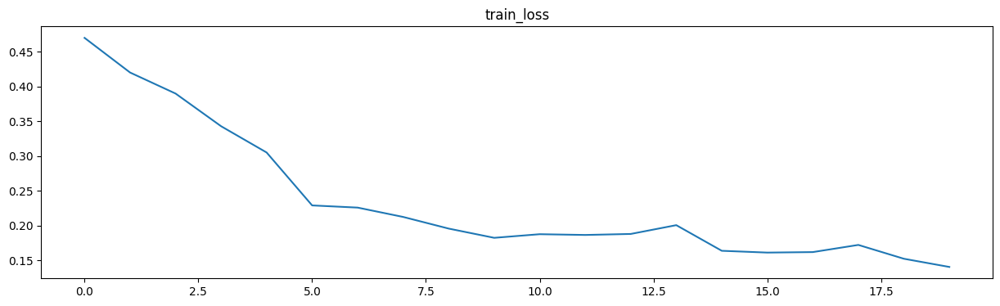

([0.10002986192703248,
  0.11065901517868042,
  0.09034662246704102,
  0.09642603993415833,
  0.06339855790138245,
  0.08193599581718444,
  0.08329460024833679,
  0.041100597381591795,
  0.041370746493339536,
  0.05403750538825989,
  0.054736024141311644,
  0.05001495480537414,
  0.0431943416595459,
  0.04425754547119141,
  0.043991729617118835,
  0.043850889801979064,
  0.04301866590976715,
  0.04271470010280609,
  0.041955262422561646,
  0.037514406442642215],
 [0.4701251983642578,
  0.42022567987442017,
  0.389926016330719,
  0.34287893772125244,
  0.30506134033203125,
  0.22883550822734833,
  0.2256874144077301,
  0.212236225605011,
  0.1954599916934967,
  0.18216432631015778,
  0.18738223612308502,
  0.186294823884964,
  0.18774010241031647,
  0.20040930807590485,
  0.1634858399629593,
  0.16090624034404755,
  0.16162076592445374,
  0.17193736135959625,
  0.1520332247018814,
  0.14020882546901703],
 [0.0,
  0.0,
  0.0,
  0.0,
  0.26000000536441803,
  0.13400000631809234,
  0.17200

In [ ]:
model_focal = SegNet().to(device)

max_epochs = 20
optimaizer = torch.optim.Adam(model_focal.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimaizer,
    patience=3,
    threshold=1e-4,
    mode="min")
train(model_focal, optimaizer, focal_loss, max_epochs, data_tr, data_val, scheduler)

In [ ]:
score_model(model_focal, iou_pytorch, data_val)

0.47800002098083494

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты?

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

### loss function: dice_bce

In [ ]:
def dice_bce_loss(y_true, y_pred):
    dice = dice_loss(y_true, y_pred)
    bce = bce_loss(y_true, y_pred)
    return bce + dice

### loss function: tversky

In [ ]:
def tversky_loss(targets, inputs):
    smooth = 1
    alpha = 0.5
    beta = 0.5
    inputs = torch.sigmoid(inputs)
    inputs = inputs.view(-1)
    targets = targets.view(-1)
    intersection = (inputs * targets).sum()
    FP = ((1-targets) * inputs).sum()
    FN = (targets * (1-inputs)).sum()

    Tversky = (intersection + smooth) / (intersection + alpha*FP + beta*FN + smooth)

    return 1 - Tversky

### loss function: focal_tversky

In [ ]:
def focal_tversky_loss(target, preds, alpha=0.7, beta = 0.3, epsilon=1e-6, gamma=3):
    preds = torch.sigmoid(preds)
    preds = preds.reshape(-1)
    target = target.reshape(-1)

    #True Positives, False Positives & False Negatives
    TP = (preds * target).sum()
    FP = ((1-target) * preds).sum()
    FN = (target * (1-preds)).sum()
    Tversky = (TP + epsilon)/(TP + alpha*FP + beta*FN + epsilon)
    FocalTversky = (1 - Tversky)**gamma

    return FocalTversky

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

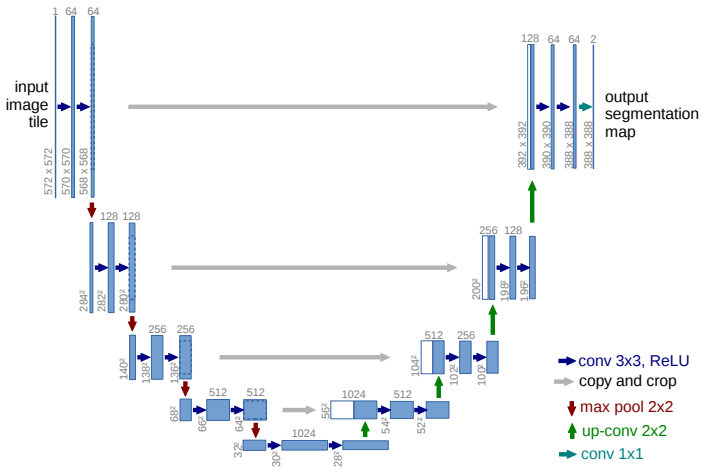

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

**Для облегчения процесса построения Unet, откроем ее структуру в [документации Pytorch](https://pytorch.org/hub/mateuszbuda_brain-segmentation-pytorch_unet/).**

<p style="align: center;"><img align=center src="https://pytorch.org/assets/images/unet_brain_mri.png" width=600 height=480/></p>

In [ ]:
import torch
model_unet = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
    in_channels=3, out_channels=1, init_features=32, pretrained=True)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/mateuszbuda/brain-segmentation-pytorch/zipball/master" to /root/.cache/torch/hub/master.zip
Downloading: "https://github.com/mateuszbuda/brain-segmentation-pytorch/releases/download/v1.0/unet-e012d006.pt" to /root/.cache/torch/hub/checkpoints/unet-e012d006.pt


In [ ]:
model_unet.to(device)

UNet(
  (encoder1): Sequential(
    (enc1conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc1norm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc1relu1): ReLU(inplace=True)
    (enc1conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc1norm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc1relu2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (enc2conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc2norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc2relu1): ReLU(inplace=True)
    (enc2conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc2norm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

### Unet_v1

In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=2, stride=2) # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.upsample1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2) # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.upsample2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2)  # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.upsample3 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=2, stride=2)  # 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU()
        )
        self.conv_out = nn.Conv2d(in_channels=32, out_channels=1, kernel_size=1)

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        u0 = self.upsample0(b)
        cat = torch.cat((u0, e3), dim=1)
        d0 = self.dec_conv0(cat)
        u1 = self.upsample1(d0)
        cat = torch.cat((u1, e2), dim=1)
        d1 = self.dec_conv1(cat)
        u2 = self.upsample2(d1)
        cat = torch.cat((u2, e1), dim=1)
        d2 = self.dec_conv2(cat)
        u3 = self.upsample3(d2)
        cat = torch.cat((u3, e0), dim=1)
        d3 = self.dec_conv3(cat)
        out = self.conv_out(d3)  # no activation
        return out

In [ ]:
unet_model = UNet().to(device)

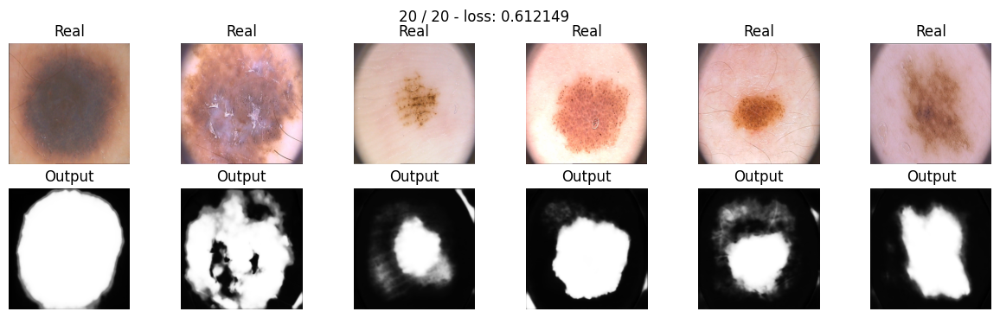

loading best model state


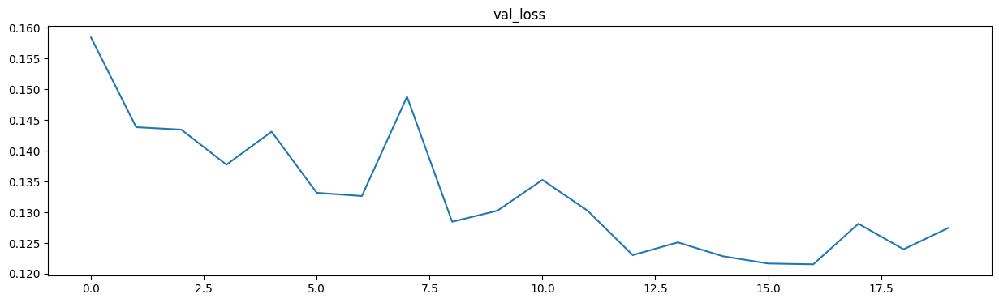

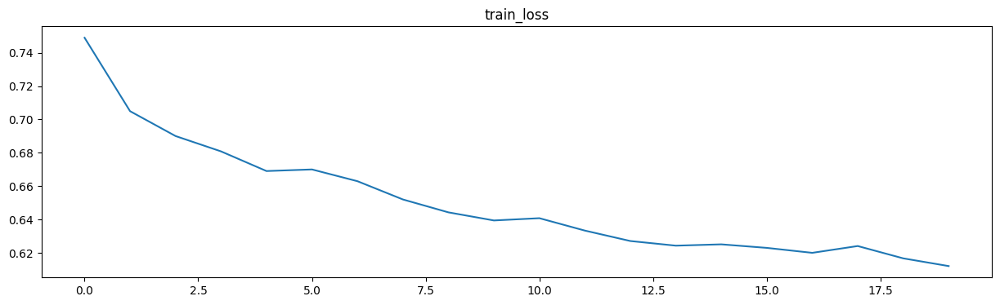

([0.1584308624267578,
  0.14384145736694337,
  0.14344154596328734,
  0.1377396821975708,
  0.143110454082489,
  0.13317035436630248,
  0.1326419711112976,
  0.14880058765411378,
  0.1284610152244568,
  0.13025310039520263,
  0.13526757955551147,
  0.13026503324508668,
  0.1230310320854187,
  0.12510758638381958,
  0.1228436827659607,
  0.12166503667831421,
  0.12153469324111939,
  0.1281399130821228,
  0.1239776849746704,
  0.1274796485900879],
 [0.7489612102508545,
  0.7049635648727417,
  0.6900683641433716,
  0.6808716058731079,
  0.6690914034843445,
  0.6700511574745178,
  0.6630060076713562,
  0.6520617008209229,
  0.6443408727645874,
  0.6394874453544617,
  0.6408463716506958,
  0.6334179639816284,
  0.6271670460700989,
  0.6243859529495239,
  0.6251744031906128,
  0.6230598092079163,
  0.6200897693634033,
  0.624164342880249,
  0.6167830228805542,
  0.6121494770050049],
 [0.11600000262260438,
  0.006000000424683094,
  0.06600000262260437,
  0.2400000050663948,
  0.32799999415874

In [ ]:
train(unet_model, torch.optim.Adam(unet_model.parameters()), bce_loss, 20, data_tr, data_val, scheduler)

In [ ]:
score_model(unet_model, iou_pytorch, data_val)

0.6660000205039978

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


### Unet_v2

In [ ]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU()
        )
        self.pool0 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=5, stride = 2, padding=1)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.pool1 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=5, stride = 2, padding=1) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.pool2 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=5, stride = 2, padding=1) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.pool3 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=5, stride = 2, padding=1) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=5, stride=2, padding=1) # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.upsample1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=5, stride=2, padding=1) # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.upsample2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=5, stride=2, padding=1)  # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.upsample3 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=6, stride=2, padding=1)  # 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU()
        )
        self.conv_out = nn.Conv2d(in_channels=32, out_channels=1, kernel_size=1)

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        u0 = self.upsample0(b)
        cat = torch.cat((u0, e3), dim=1)
        d0 = self.dec_conv0(cat)
        u1 = self.upsample1(d0)
        cat = torch.cat((u1, e2), dim=1)
        d1 = self.dec_conv1(cat)
        u2 = self.upsample2(d1)
        cat = torch.cat((u2, e1), dim=1)
        d2 = self.dec_conv2(cat)
        u3 = self.upsample3(d2)
        cat = torch.cat((u3, e0), dim=1)
        d3 = self.dec_conv3(cat)
        out = self.conv_out(d3)  # no activation
        return out

In [ ]:
unet2_model = UNet2().to(device)

In [ ]:
optimaizer = torch.optim.Adam(unet2_model.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimaizer,
    patience=3,
    threshold=1e-4,
    mode="min")

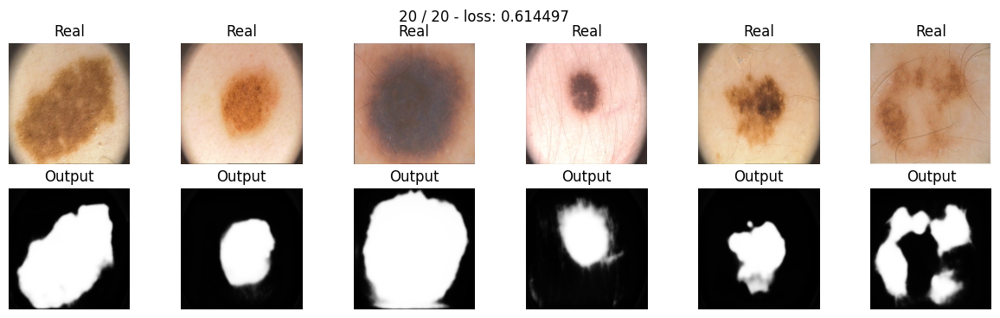

loading best model state


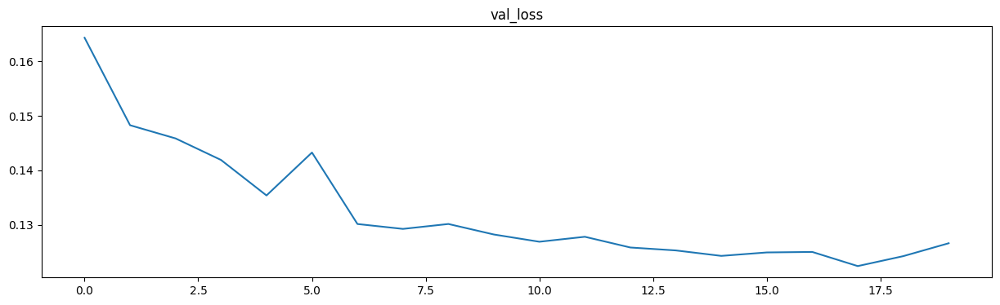

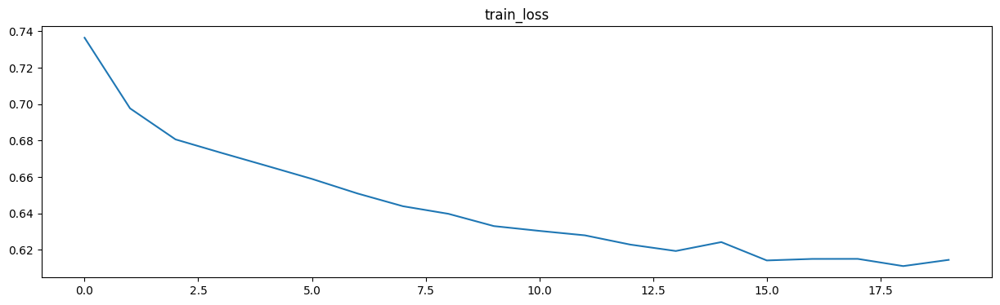

([0.16437450647354127,
  0.14828810691833497,
  0.14586384296417237,
  0.14190086126327514,
  0.135375714302063,
  0.14326599836349488,
  0.13012354373931884,
  0.12922379970550538,
  0.13012770414352418,
  0.12819485664367675,
  0.12686268091201783,
  0.12777607440948485,
  0.12580492496490478,
  0.12526522874832152,
  0.12426096200942993,
  0.12489591836929322,
  0.12498806715011597,
  0.12238644361495972,
  0.12421165704727173,
  0.12658644914627076],
 [0.7364201545715332,
  0.6976474523544312,
  0.6806073188781738,
  0.6732901334762573,
  0.6661429405212402,
  0.6589228510856628,
  0.6509386897087097,
  0.6439362168312073,
  0.6397714018821716,
  0.6330297589302063,
  0.6304014921188354,
  0.627959668636322,
  0.6228688955307007,
  0.619357705116272,
  0.6242488026618958,
  0.614175021648407,
  0.6150112748146057,
  0.6150400638580322,
  0.6110779643058777,
  0.6144967079162598],
 [0.13400000780820848,
  0.0,
  0.04000000078231096,
  0.21200000047683715,
  0.3000000029802322,
  0.3

In [ ]:
train(unet2_model, optimaizer, bce_loss, 20, data_tr, data_val, scheduler)

In [ ]:
score_model(unet2_model, iou_pytorch, data_val)

0.650000023841858

Сделайте вывод, какая из моделей лучше

**Вывод:**

На 20-ти эпохах модель `Unet_v1` показывает немного лучше качество (прирост порядка 1.5%), против - `Unet_v2`, при функции потерь: `bce_loss`.

# Отчет (6 баллов):
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте.
Если вы пропустили какую-то часть в задании выше, то вы все равно можете получить основную часть баллов в отчете, если правильно зададите проверяемые вами гипотезы.


Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверяющий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.

Дополнительные комментарии:

Пусть у вас есть N обученных моделей.
- Является ли отчетом N графиков с 1 линей? Да, но очень низкокачественным, потому что проверяющий не сможет сам сравнить их.

- Является ли отчетом 1 график с N линиями? Да, но скорее всего таким образом вы отразили лишь один эффект. Этого мало, чтобы сделать досточно суждений по поводу вашей работа.

- Я проверял метрики на трейне, и привел в результате таблицу с N числами, что не так? ключейвой момент тут, что вы измеряли на трейне ваши метрики, уверены ли вы, что заивисмости останутся такими же на отложенной выборке?

- Я сделал отчет содержащий график лоссов и метрик, и у меня нет ошибок в основной части, но за отчет не стоит максимум, почему? Естестественно максимум баллов за отчет можно получить не за 2 графика (даже при условии их полной правильности). Проверяющий хочет видеть больше сравнений моделей, чем метрики и лоссы (особенно, если они на трейне).

Советы: попробуйте правильно поставить вопрос на который вы себе отвечаете и продемонстрировать таблицу/график, помогающий проверяющему увидеть ответ на этот вопрос. Пример: Ваня хочет узнать, с каким из 4-х лоссов модель (например, U-Net) имеет наилучшее качество. Что нужно сделать Ване? Обучить 4 одинаковых модели с разными лосс функциями. И измерить итогововое качество. Продемонстрировать результаты своих измерений и итоговый вывод. (warning: конечно же, это не идеально ответит на наш вопрос, так как мы не учитываем в экспериментах возможные различные типы ошибок, но для первого приближения этого вполне достаточно).

Примерное время на подготовку отчета 1 час, он содержит сравнеение метрик, график лоссов, выбор лучших моделей из нескольких кластеров и выбор просто лучшей модели, небольшой вывод по всему дз, возможно сравнение результирующих сегментаций, времени или числа параметров модели, проявляйте креативность.

# Testing and conclusions

In [ ]:
import pandas as pd
tesing_results = pd.DataFrame(columns=['model', 'loss', 'val_loss_score', 'iou_test_score'])
max_epochs = 20

In [ ]:
def testing_models(model, epochs, loss, data_tr, data_val, data_ts, loss_name, model_name):
    global tesing_results
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        patience=5,
        threshold=1e-4,
        mode="min"
        )

    val_loss, _, iou_valid_scores = train(model, optimizer, loss, epochs, data_tr, data_val, scheduler)
    iou_test_score = score_model(model, iou_pytorch, data_ts)

    tesing_results = tesing_results.append(
        pd.Series([
               model_name,
               loss_name,
               np.mean(val_loss),
               iou_test_score],
              index=tesing_results.columns),
              ignore_index=True)
    return val_loss, iou_valid_scores

### Testing SegNet

#### Segnet with loss function: bce

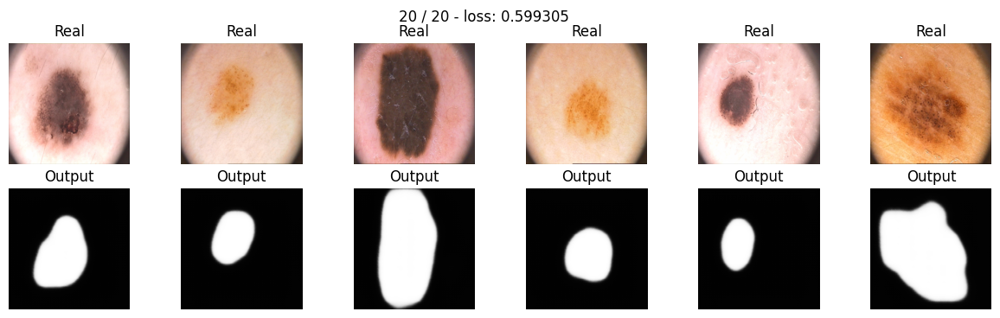

loading best model state


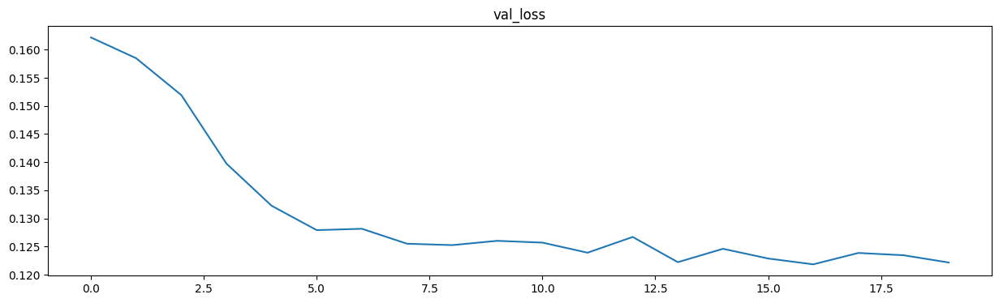

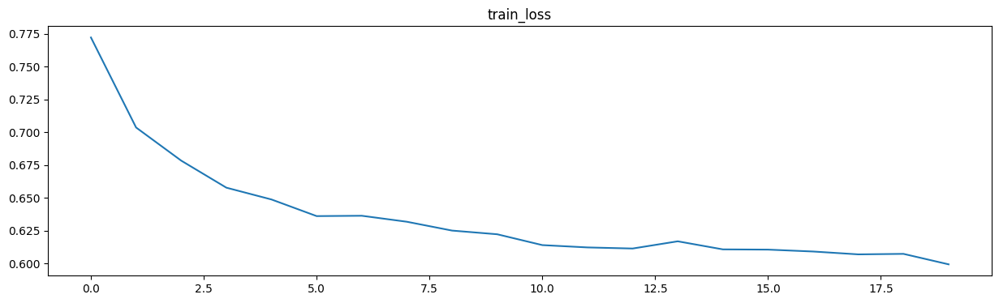

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_segnet_bce = SegNet().to(device)

segnet_bce_val_loss, segnet_bce_iou_valid_scores = testing_models(
    model_segnet_bce,
    max_epochs,
    bce_loss,
    data_tr,
    data_val,
    data_ts,
    'bce_loss',
    'segnet',
    )

#### Segnet with loss function: dice

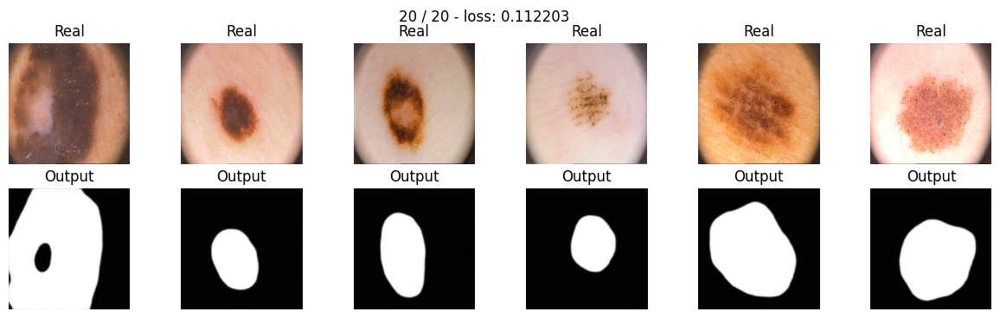

loading best model state


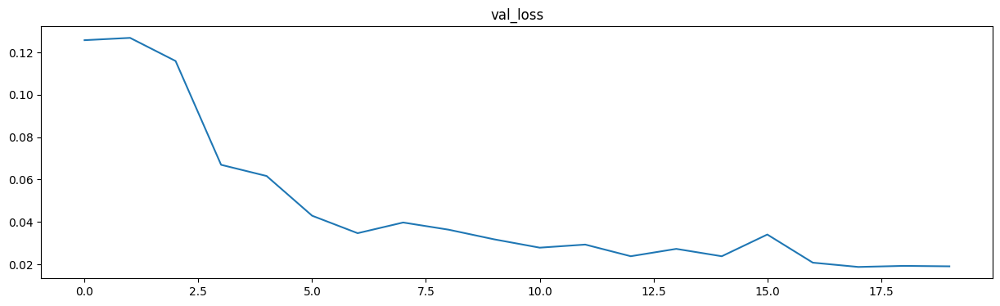

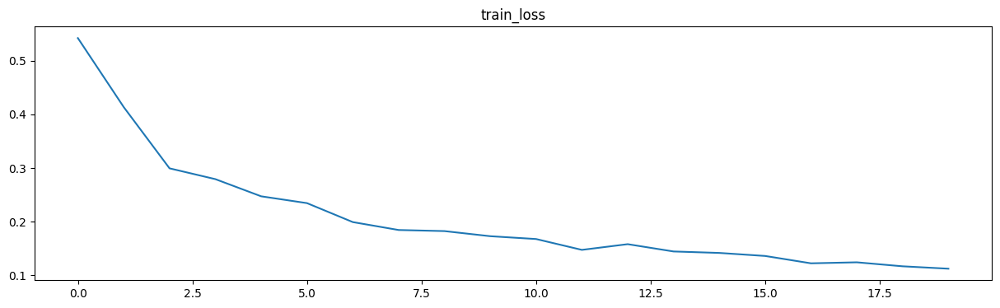

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_segnet_dice = SegNet().to(device)

segnet_dice_val_loss, segnet_dice_iou_valid_scores = testing_models(
    model_segnet_dice,
    max_epochs,
    dice_loss,
    data_tr,
    data_val,
    data_ts,
    'dice_loss',
    'segnet',
    )

#### Segnet with loss function: dice bce

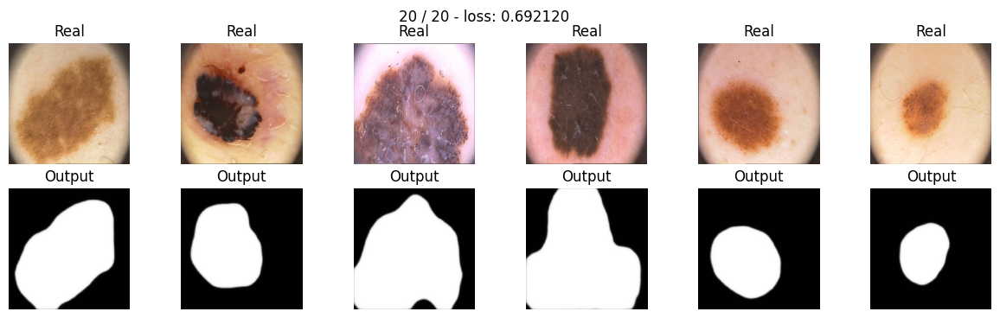

loading best model state


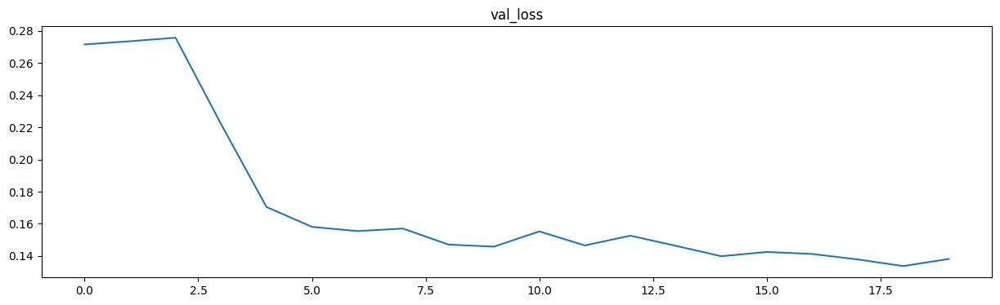

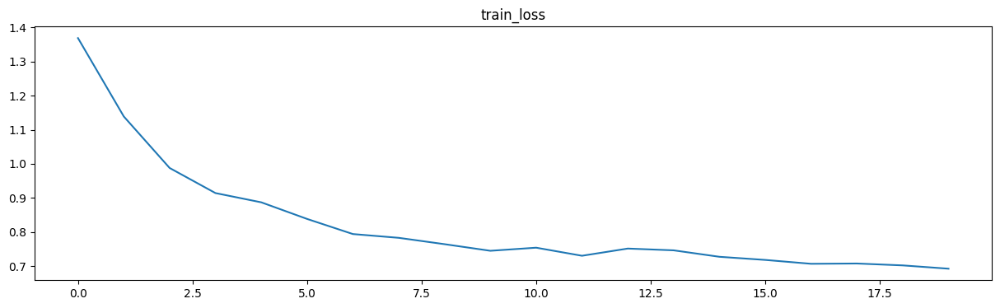

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_segnet_dice_bce = SegNet().to(device)

segnet_dice_bce_val_loss, segnet_dice_bce_iou_valid_scores = testing_models(
    model_segnet_dice_bce,
    max_epochs,
    dice_bce_loss,
    data_tr,
    data_val,
    data_ts,
    'dice_bce_loss',
    'segnet',
    )

#### Segnet with loss function: focal

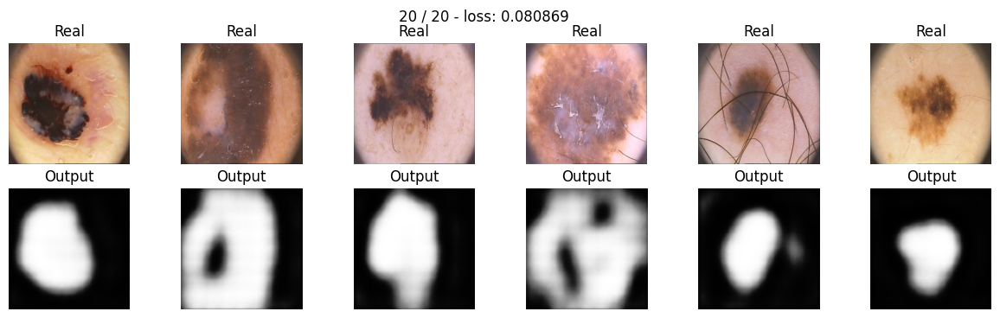

loading best model state


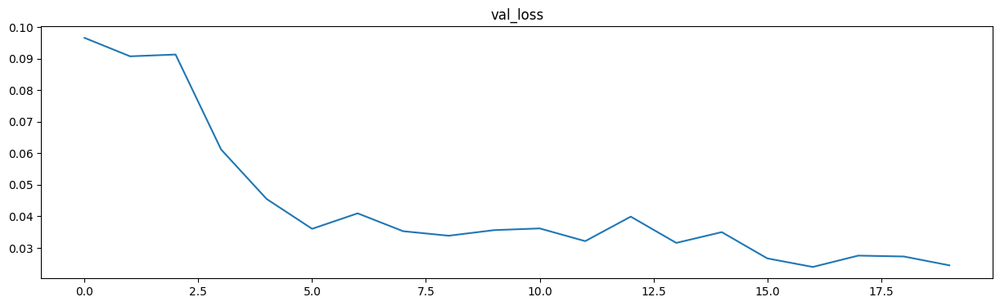

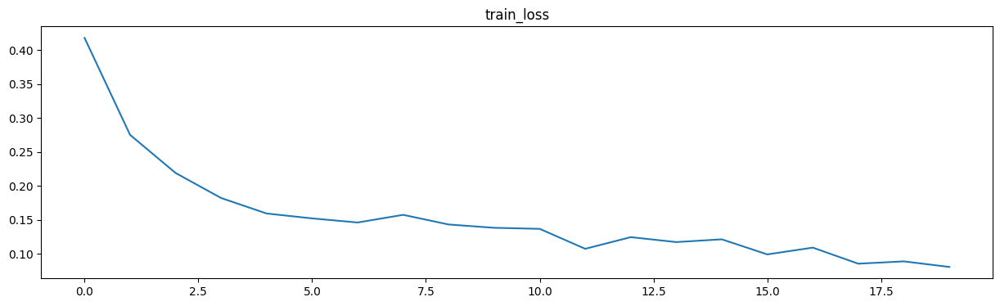

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_segnet_focal = SegNet().to(device)

segnet_focal_val_loss, segnet_focal_iou_valid_scores = testing_models(
    model_segnet_focal,
    max_epochs,
    focal_loss,
    data_tr,
    data_val,
    data_ts,
    'focal_loss',
    'segnet',
    )

#### Segnet with loss function: tversky

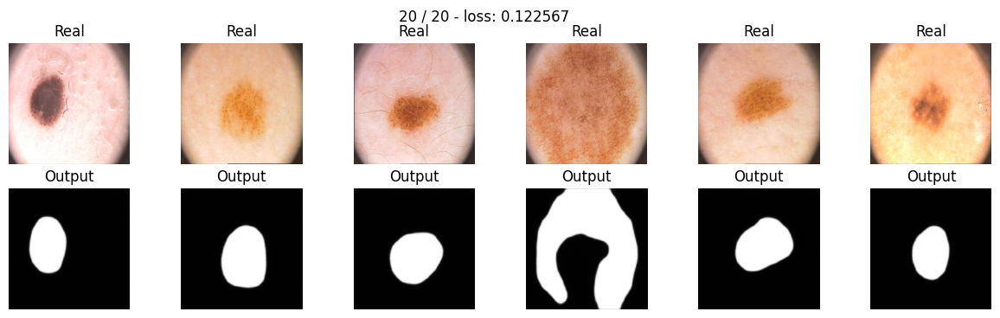

loading best model state


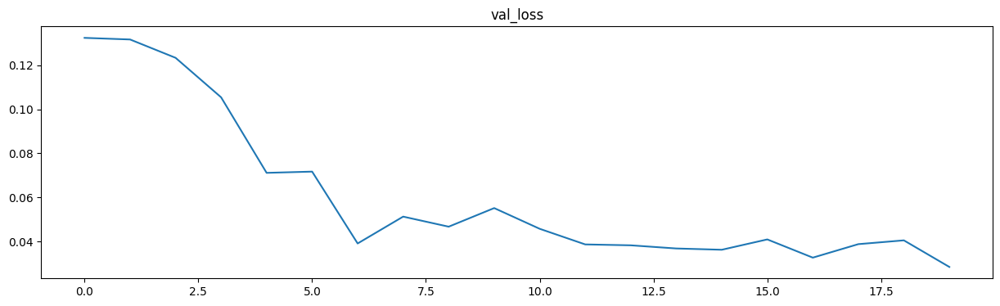

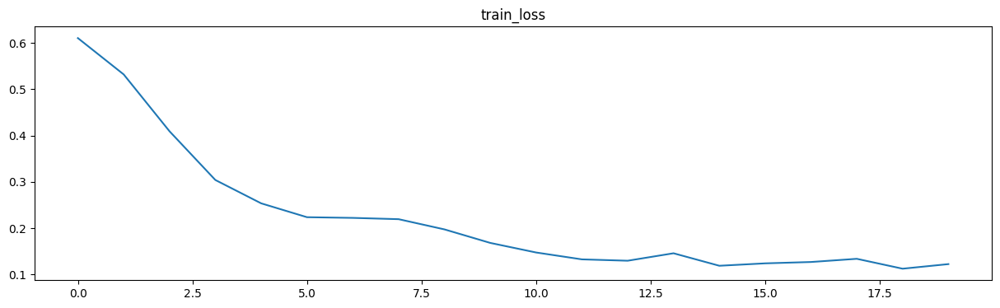

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_segnet_tversky = SegNet().to(device)

segnet_tversky_val_loss, segnet_tversky_iou_valid_scores = testing_models(
    model_segnet_tversky,
    max_epochs,
    tversky_loss,
    data_tr,
    data_val,
    data_ts,
    'tversky_loss',
    'segnet',
    )

#### Segnet with loss function: focal tversky

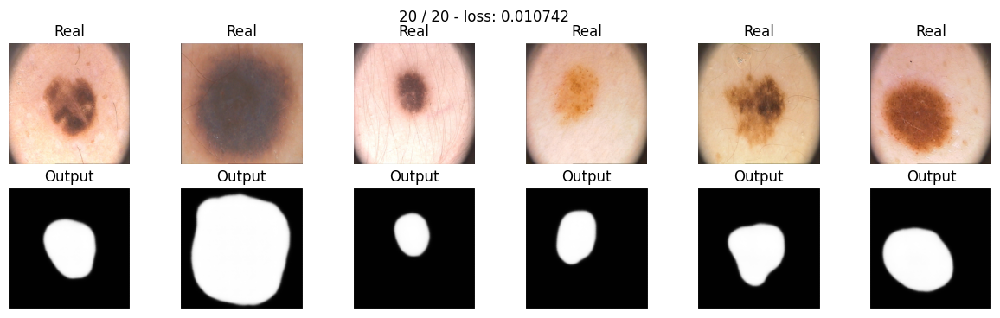

loading best model state


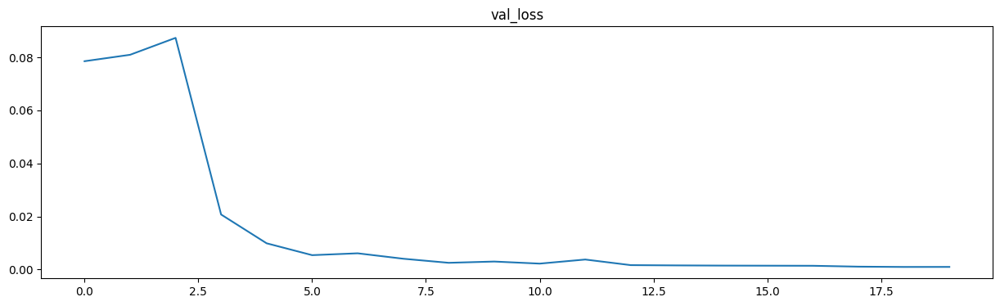

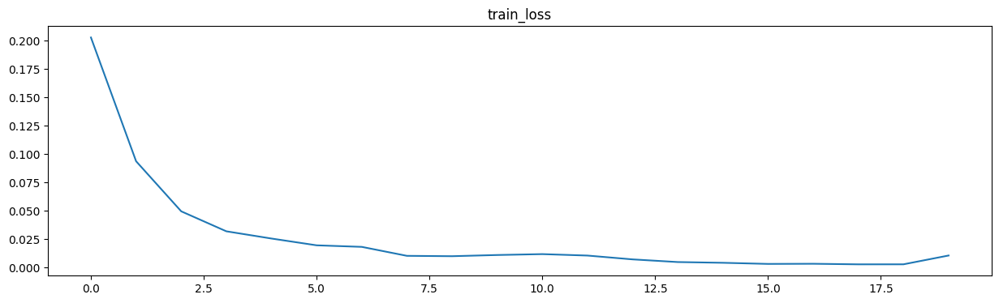

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_segnet_focal_tversky = SegNet().to(device)

segnet_focal_tversky_val_loss, segnet_focal_tversky_iou_valid_scores = testing_models(
    model_segnet_focal_tversky,
    max_epochs,
    focal_tversky_loss,
    data_tr,
    data_val,
    data_ts,
    'focal_tversky_loss',
    'segnet',
    )

#### Вывод по SegNet

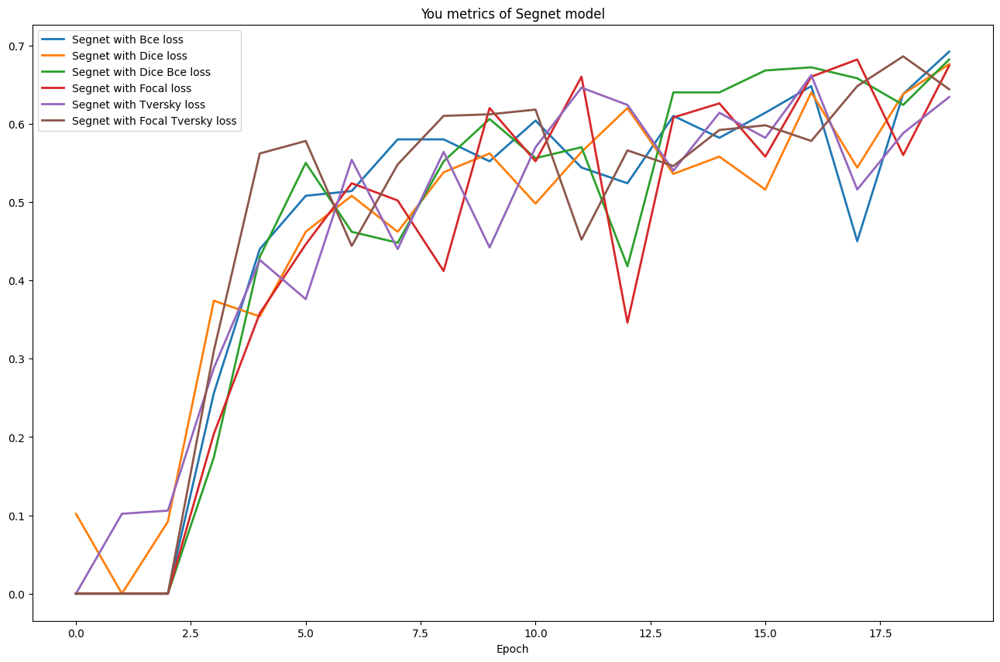

In [ ]:
plt.figure(figsize=(16, 10))
plt.title("You metrics of Segnet model")
plt.plot(range(max_epochs), segnet_bce_iou_valid_scores, label="Segnet with Bce loss", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_iou_valid_scores, label="Segnet with Dice loss", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_bce_iou_valid_scores, label="Segnet with Dice Bce loss", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_iou_valid_scores, label="Segnet with Focal loss", linewidth=2)
plt.plot(range(max_epochs), segnet_tversky_iou_valid_scores, label="Segnet with Tversky loss", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_tversky_iou_valid_scores, label="Segnet with Focal Tversky loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

In [ ]:
tesing_results

,model,loss,val_loss_score,iou_test_score
0,segnet,bce_loss,0.130735,0.616
1,segnet,dice_loss,0.046342,0.570
2,segnet,dice_bce_loss,0.170536,0.658
3,segnet,focal_loss,0.043600,0.668
4,segnet,tversky_loss,0.060221,0.678
5,segnet,focal_tversky_loss,0.015734,0.702


### Testing UNet_v1

#### UNet_v1 with loss function: bce

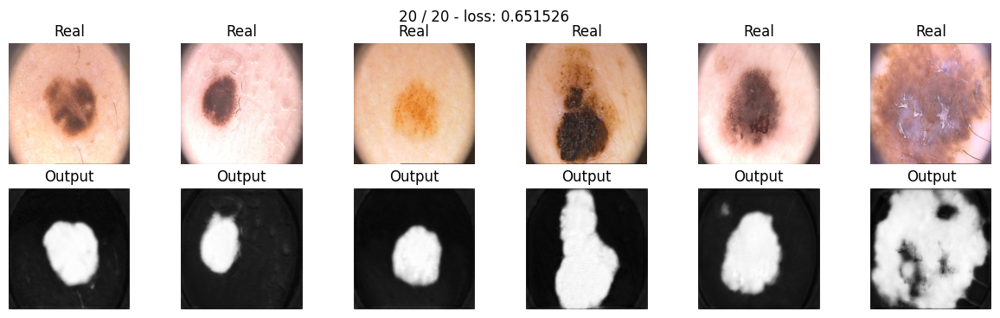

loading best model state


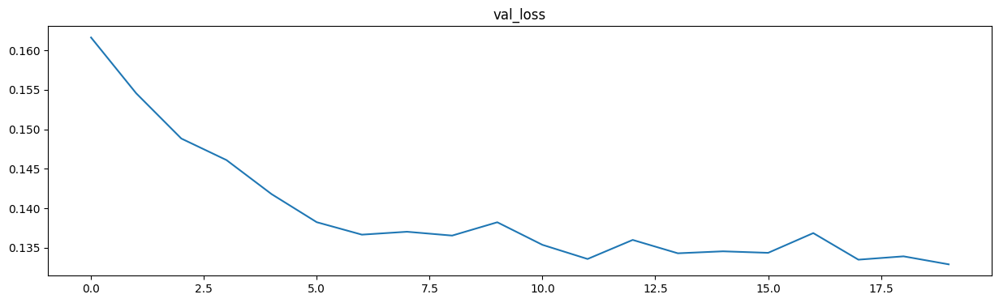

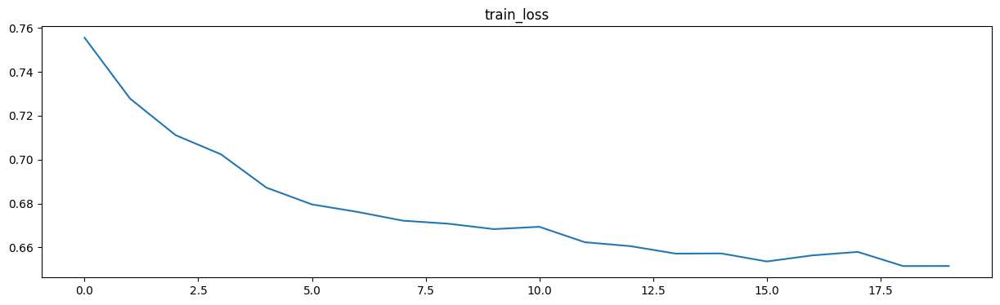

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v1_bce = UNet().to(device)

unet_v1_bce_val_loss, unet_v1_bce_iou_valid_scores = testing_models(
    model_unet_v1_bce,
    max_epochs,
    bce_loss,
    data_tr,
    data_val,
    data_ts,
    'bce_loss',
    'unet_v1',
    )

#### UNet_v1 with loss function: dice

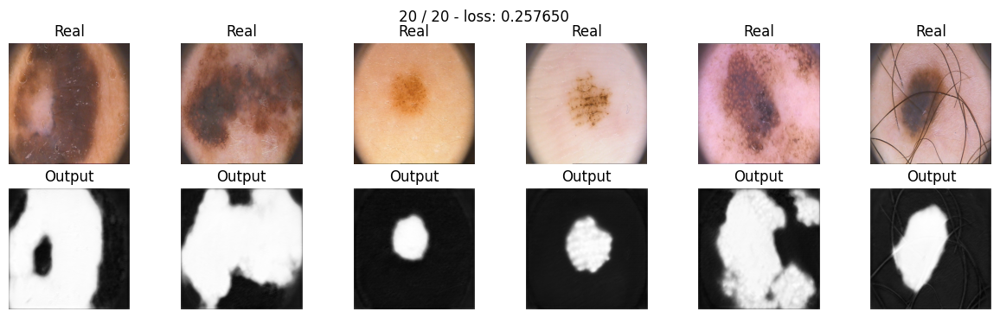

loading best model state


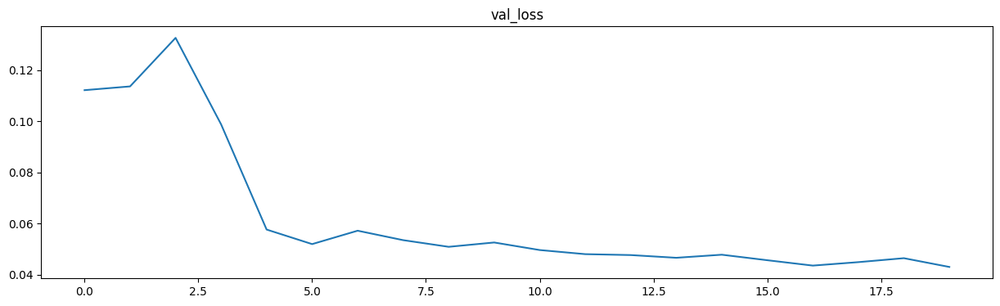

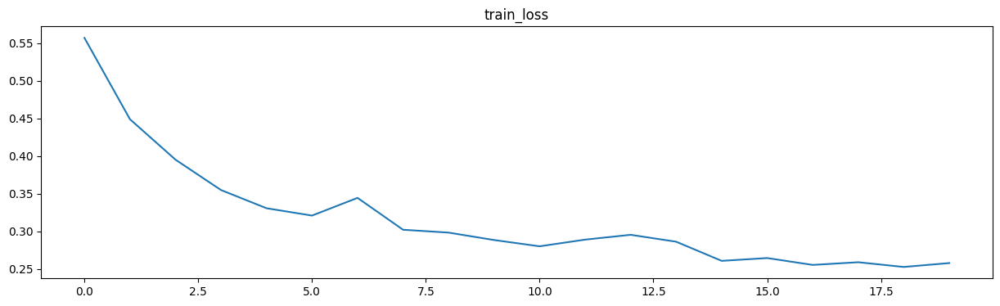

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v1_dice = UNet().to(device)

unet_v1_dice_val_loss, unet_v1_dice_iou_valid_scores = testing_models(
    model_unet_v1_dice,
    max_epochs,
    dice_loss,
    data_tr,
    data_val,
    data_ts,
    'dice_loss',
    'unet_v1',
    )

#### UNet_v1 with loss function: dice bce

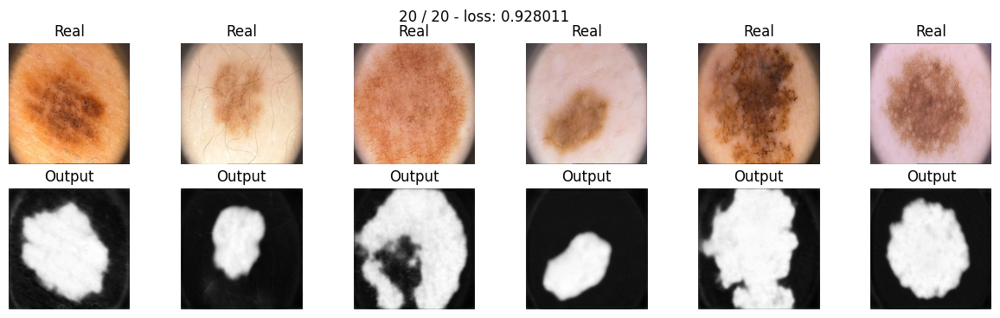

loading best model state


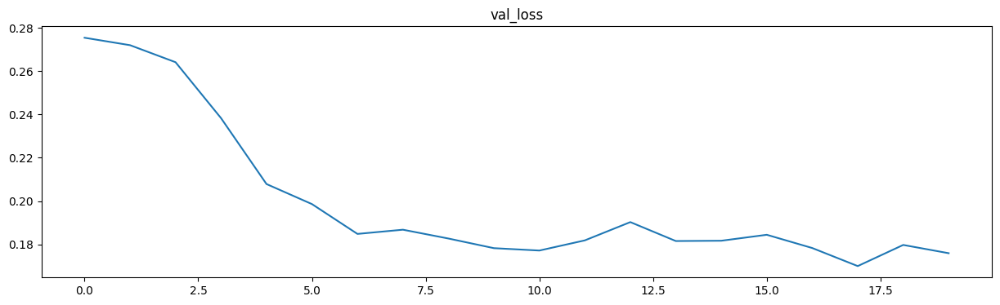

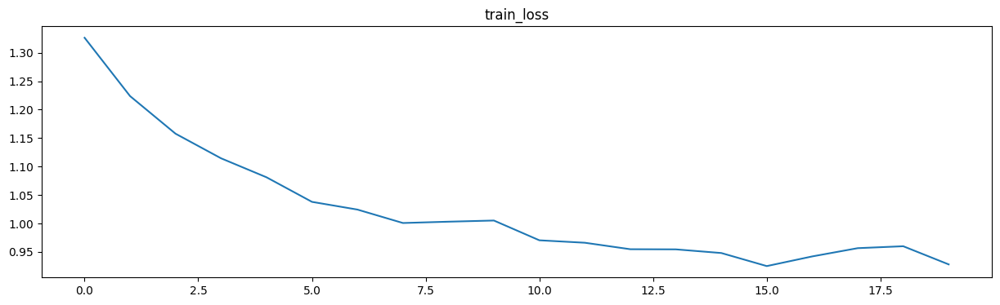

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v1_dice_bce = UNet().to(device)

unet_v1_dice_bce_val_loss, unet_v1_dice_bce_iou_valid_scores = testing_models(
    model_unet_v1_dice_bce,
    max_epochs,
    dice_bce_loss,
    data_tr,
    data_val,
    data_ts,
    'dice_bce_loss',
    'unet_v1',
    )

#### UNet_v1 with loss function: focal

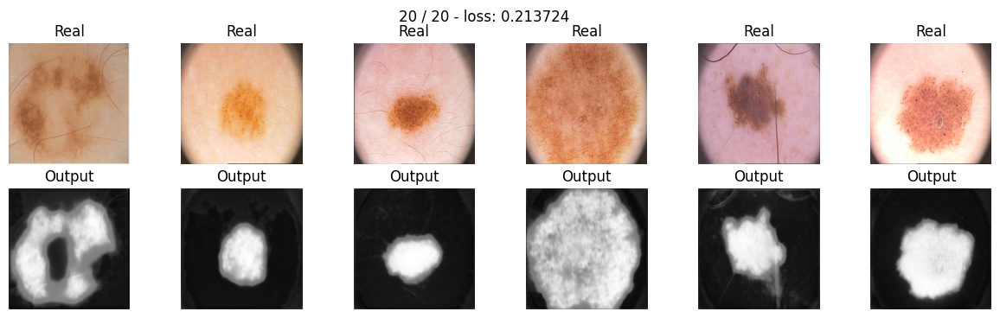

loading best model state


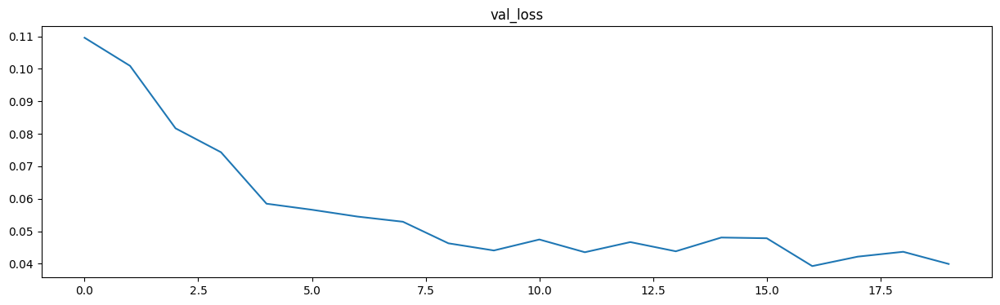

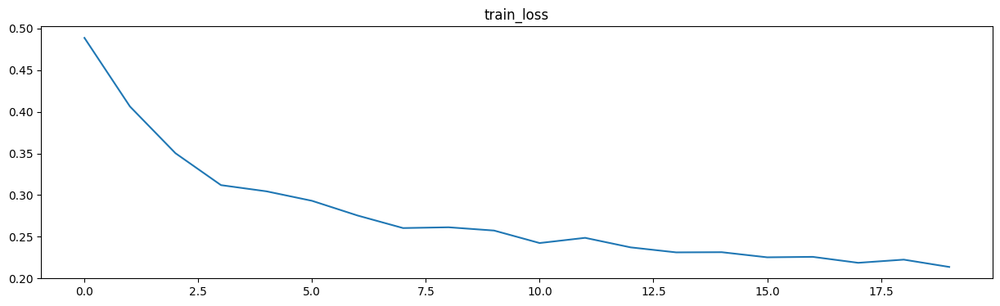

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v1_focal = UNet().to(device)

unet_v1_focal_val_loss, unet_v1_focal_iou_valid_scores = testing_models(
    model_unet_v1_focal,
    max_epochs,
    focal_loss,
    data_tr,
    data_val,
    data_ts,
    'focal_loss',
    'unet_v1',
    )

#### UNet_v1 with loss function: tversky

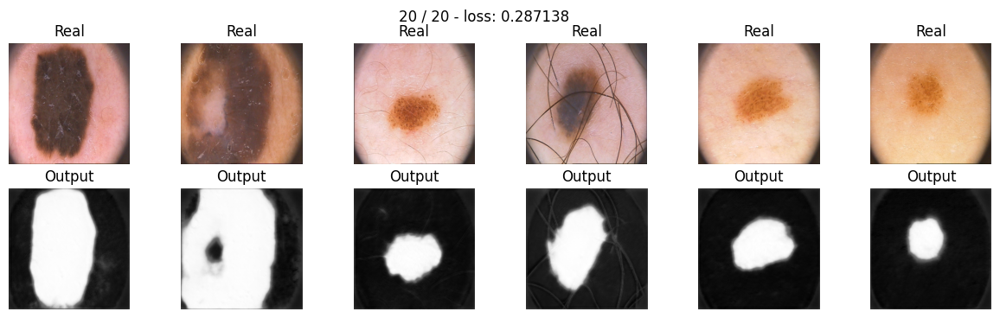

loading best model state


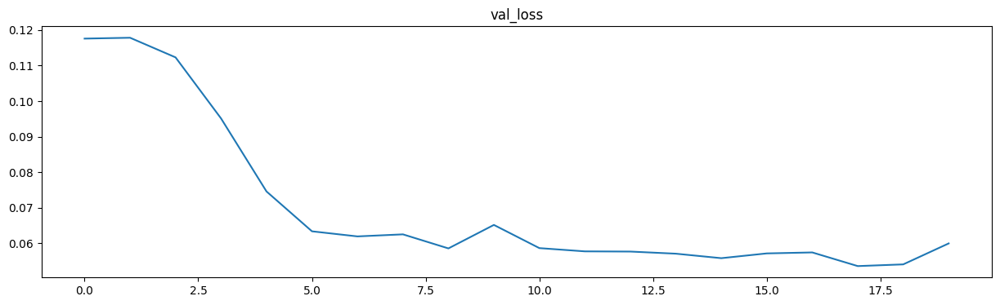

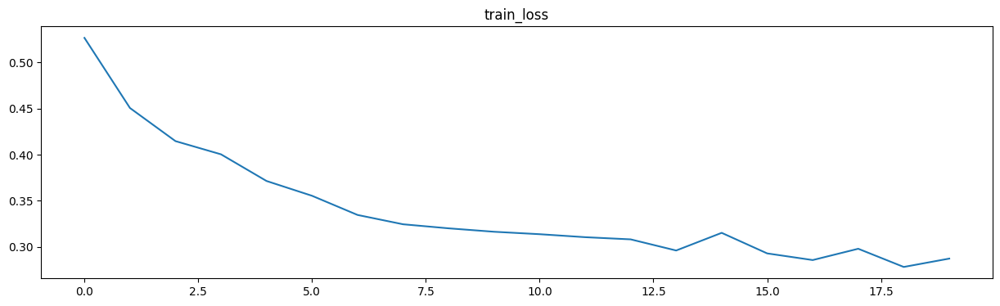

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v1_tversky = UNet().to(device)

unet_v1_tversky_val_loss, unet_v1_tversky_iou_valid_scores = testing_models(
    model_unet_v1_tversky,
    max_epochs,
    tversky_loss,
    data_tr,
    data_val,
    data_ts,
    'tversky_loss',
    'unet_v1',
    )

#### UNet_v1 with loss function: focal tversky

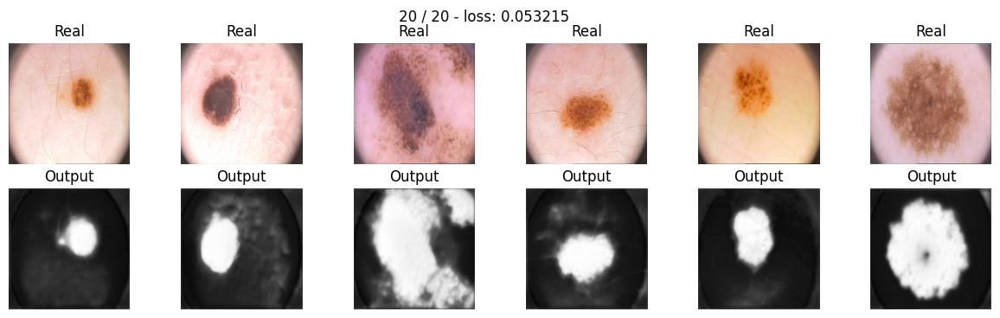

loading best model state


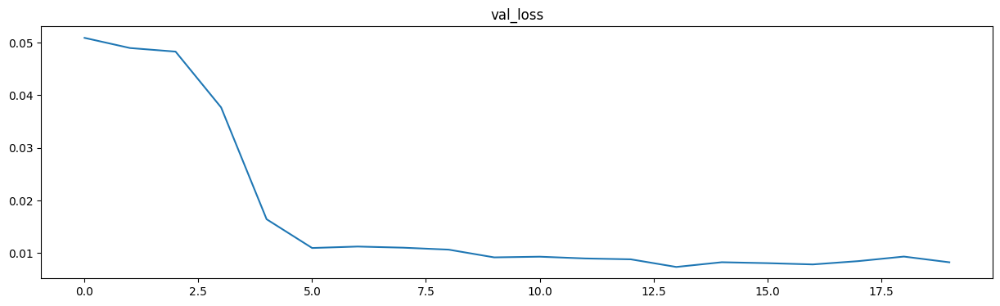

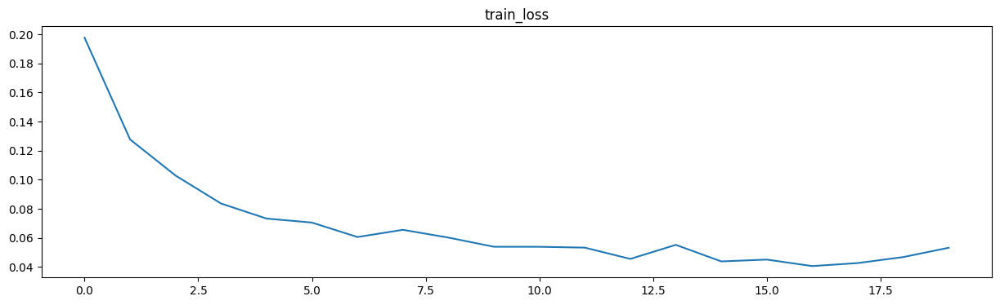

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v1_focal_tversky = UNet().to(device)

unet_v1_focal_tversky_val_loss, unet_v1_focal_tversky_iou_valid_scores = testing_models(
    model_unet_v1_focal_tversky,
    max_epochs,
    focal_tversky_loss,
    data_tr,
    data_val,
    data_ts,
    'focal_tversky_loss',
    'unet_v1',
    )

#### Вывод по Unet_v1

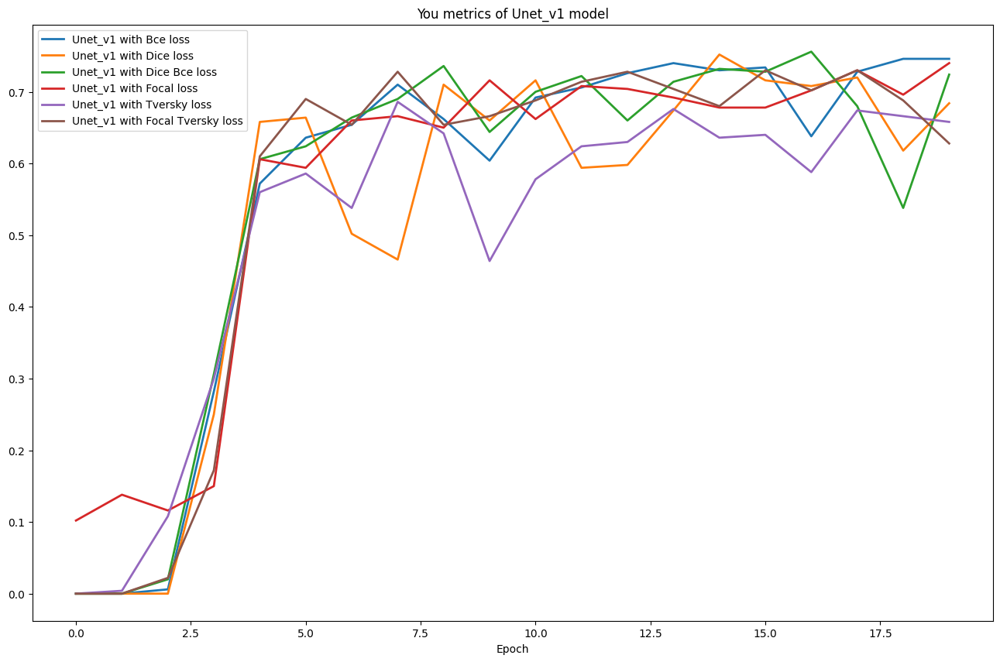

In [ ]:
plt.figure(figsize=(16, 10))
plt.title("You metrics of Unet_v1 model")
plt.plot(range(max_epochs), unet_v1_bce_iou_valid_scores, label="Unet_v1 with Bce loss", linewidth=2)
plt.plot(range(max_epochs), unet_v1_dice_iou_valid_scores, label="Unet_v1 with Dice loss", linewidth=2)
plt.plot(range(max_epochs), unet_v1_dice_bce_iou_valid_scores, label="Unet_v1 with Dice Bce loss", linewidth=2)
plt.plot(range(max_epochs), unet_v1_focal_iou_valid_scores, label="Unet_v1 with Focal loss", linewidth=2)
plt.plot(range(max_epochs), unet_v1_tversky_iou_valid_scores, label="Unet_v1 with Tversky loss", linewidth=2)
plt.plot(range(max_epochs), unet_v1_focal_tversky_iou_valid_scores, label="Unet_v1 with Focal Tversky loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

In [ ]:
tesing_results

,model,loss,val_loss_score,iou_test_score
0,segnet,bce_loss,0.130735,0.616
1,segnet,dice_loss,0.046342,0.570
2,segnet,dice_bce_loss,0.170536,0.658
3,segnet,focal_loss,0.043600,0.668
4,segnet,tversky_loss,0.060221,0.678
5,segnet,focal_tversky_loss,0.015734,0.702
6,unet_v1,bce_loss,0.139233,0.774
7,unet_v1,dice_loss,0.062220,0.742
8,unet_v1,dice_bce_loss,0.199492,0.676
9,unet_v1,focal_loss,0.056084,0.706


### Testing UNet_v2

#### UNet_v2 with loss function: bce

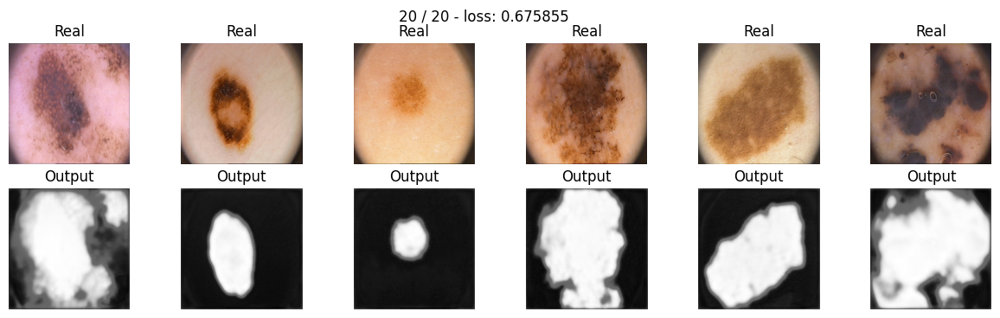

loading best model state


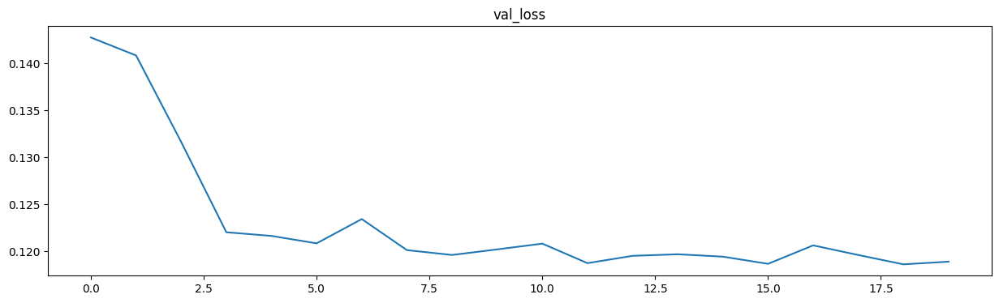

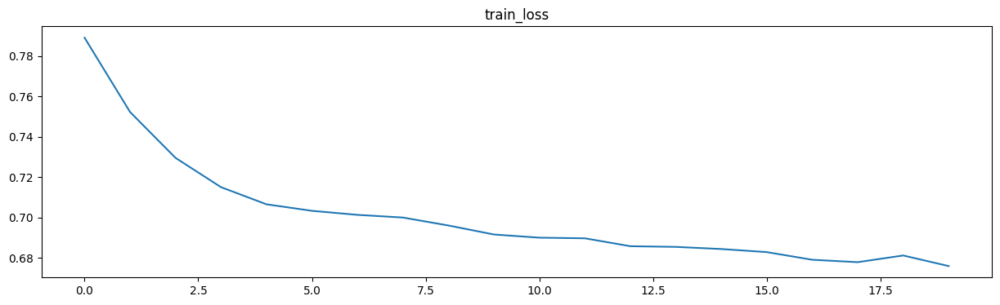

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v2_bce = UNet2().to(device)

unet_v2_bce_val_loss, unet_v2_bce_iou_valid_scores = testing_models(
    model_unet_v2_bce,
    max_epochs,
    bce_loss,
    data_tr,
    data_val,
    data_ts,
    'bce_loss',
    'unet_v2',
    )

#### UNet_v2 with loss function: dice

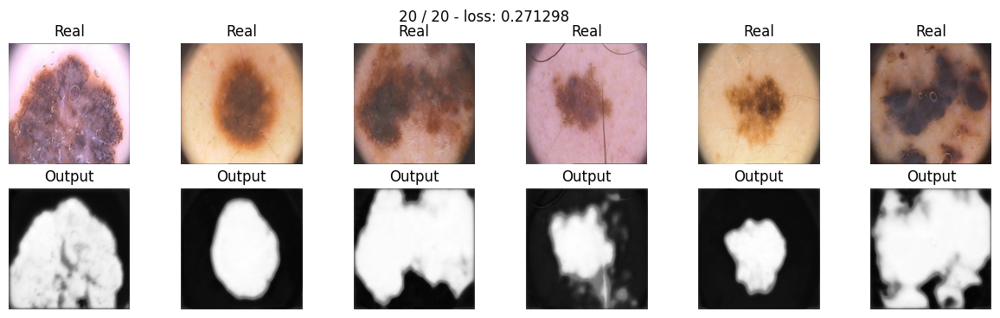

loading best model state


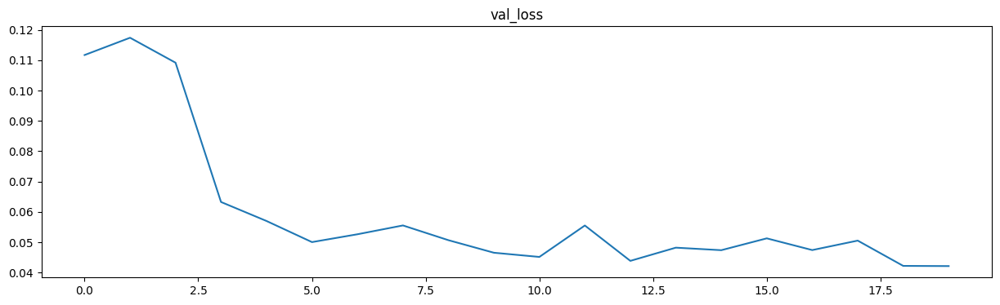

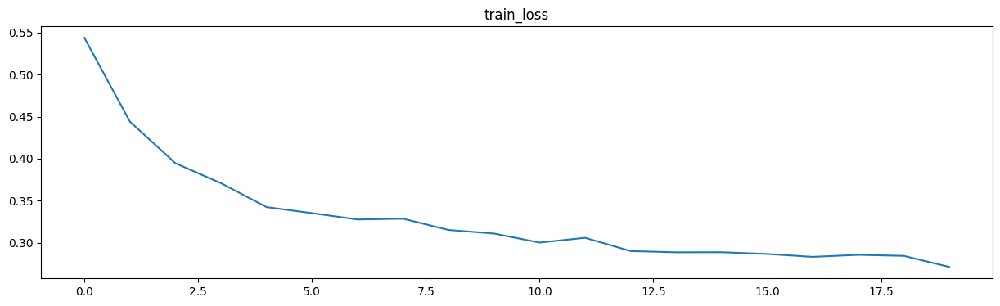

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v2_dice = UNet2().to(device)

unet_v2_dice_val_loss, unet_v2_dice_iou_valid_scores = testing_models(
    model_unet_v2_dice,
    max_epochs,
    dice_loss,
    data_tr,
    data_val,
    data_ts,
    'dice_loss',
    'unet_v2',
    )

#### UNet_v2 with loss function: dice bce

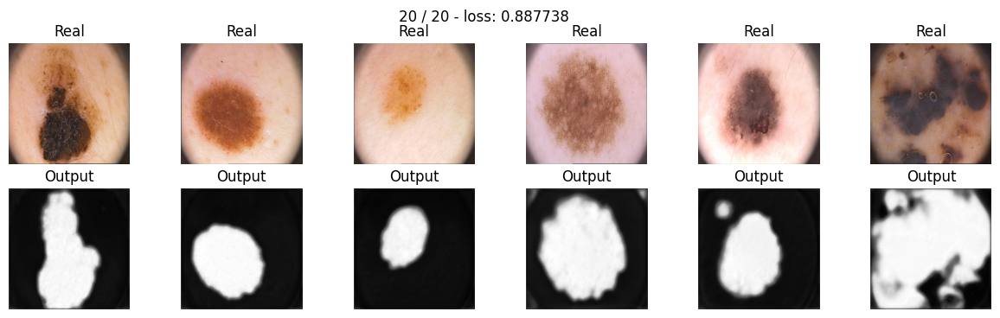

loading best model state


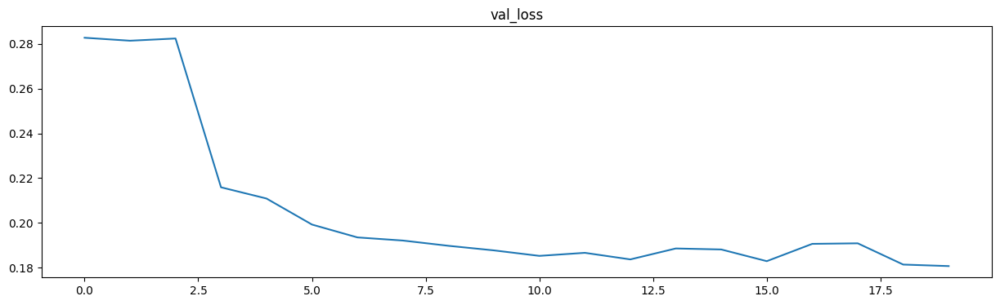

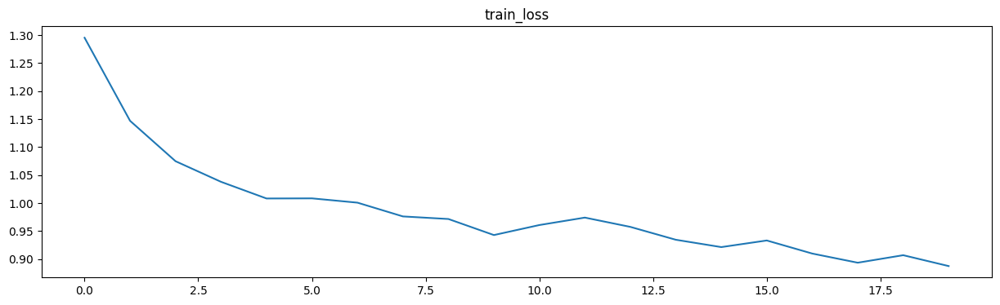

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v2_dice_bce = UNet2().to(device)

unet_v2_dice_bce_val_loss, unet_v2_dice_bce_iou_valid_scores = testing_models(
    model_unet_v2_dice_bce,
    max_epochs,
    dice_bce_loss,
    data_tr,
    data_val,
    data_ts,
    'dice_bce_loss',
    'unet_v2',
    )

#### UNet_v2 with loss function: focal

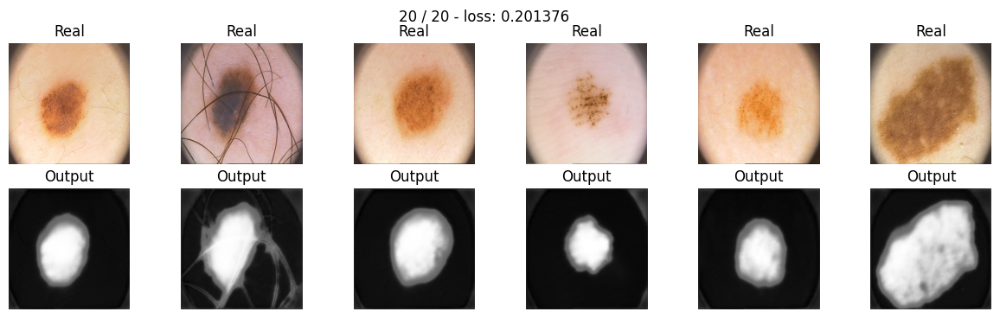

loading best model state


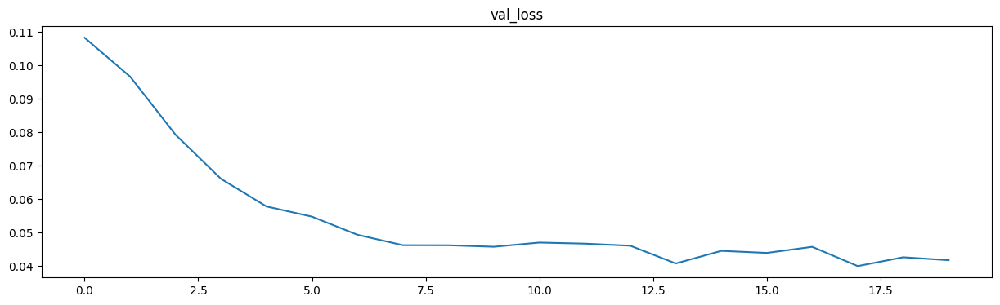

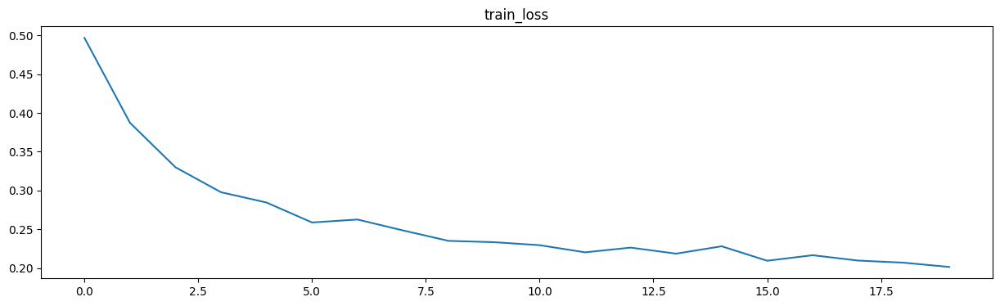

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v2_focal = UNet2().to(device)

unet_v2_focal_val_loss, unet_v2_focal_iou_valid_scores = testing_models(
    model_unet_v2_focal,
    max_epochs,
    focal_loss,
    data_tr,
    data_val,
    data_ts,
    'focal_loss',
    'unet_v2',
    )

#### UNet_v2 with loss function: tversky

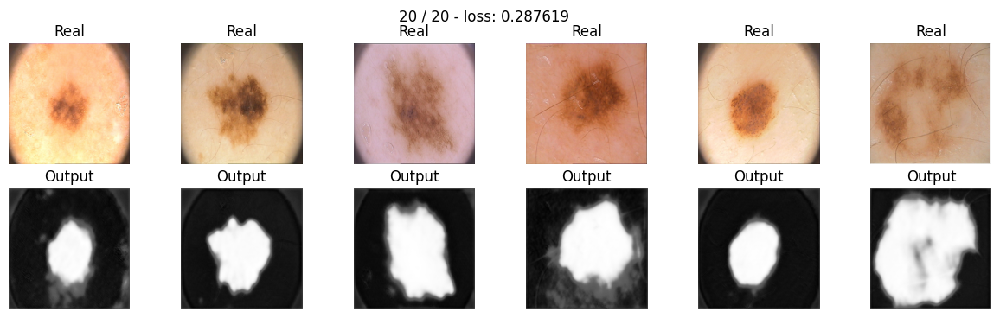

loading best model state


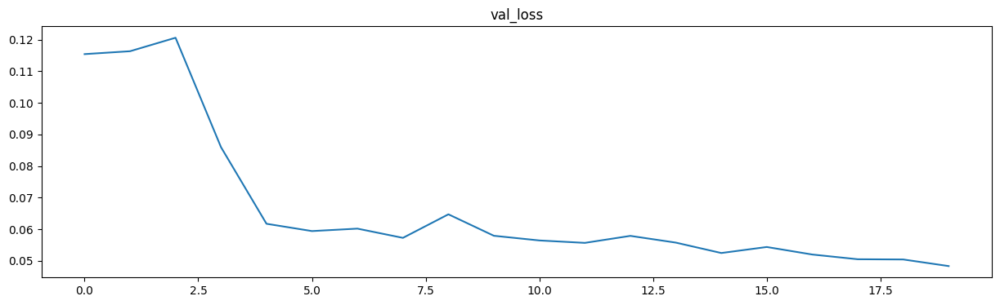

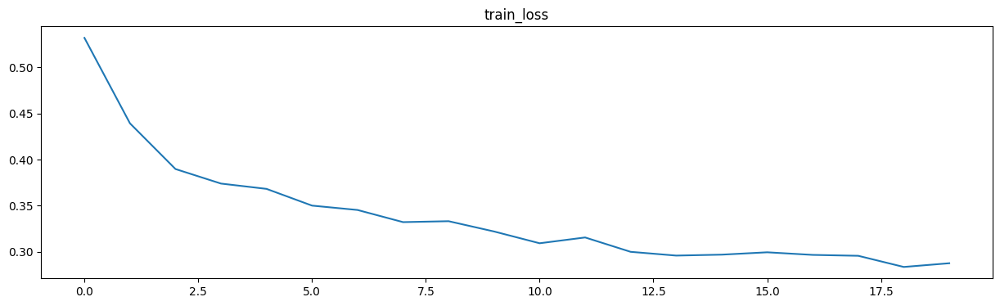

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v2_tversky = UNet2().to(device)

unet_v2_tversky_val_loss, unet_v2_tversky_iou_valid_scores = testing_models(
    model_unet_v2_tversky,
    max_epochs,
    tversky_loss,
    data_tr,
    data_val,
    data_ts,
    'tversky_loss',
    'unet_v2',
    )

#### UNet_v2 with loss function: focal tversky

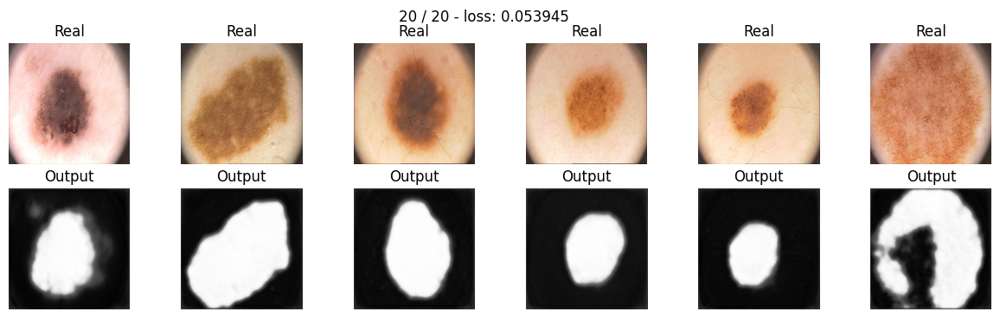

loading best model state


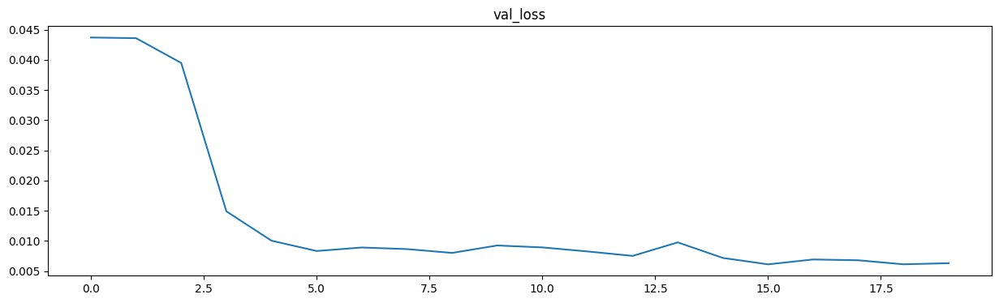

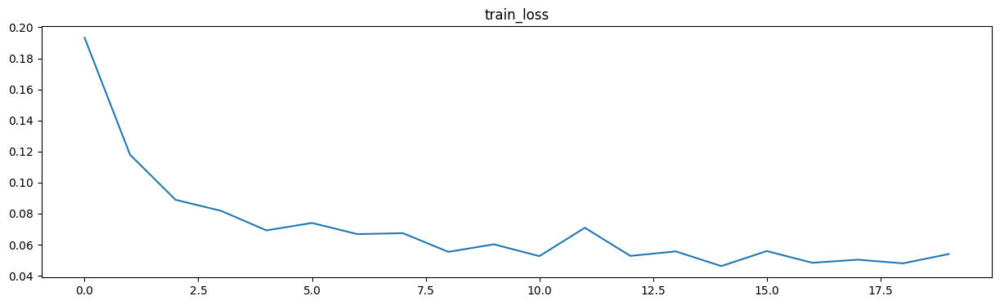

<ipython-input-46-724d49e145be>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tesing_results = tesing_results.append(


In [ ]:
model_unet_v2_focal_tversky = UNet2().to(device)

unet_v2_focal_tversky_val_loss, unet_v2_focal_tversky_iou_valid_scores = testing_models(
    model_unet_v2_focal_tversky,
    max_epochs,
    focal_tversky_loss,
    data_tr,
    data_val,
    data_ts,
    'focal_tversky_loss',
    'unet_v2',
    )

#### Вывод по Unet_v2

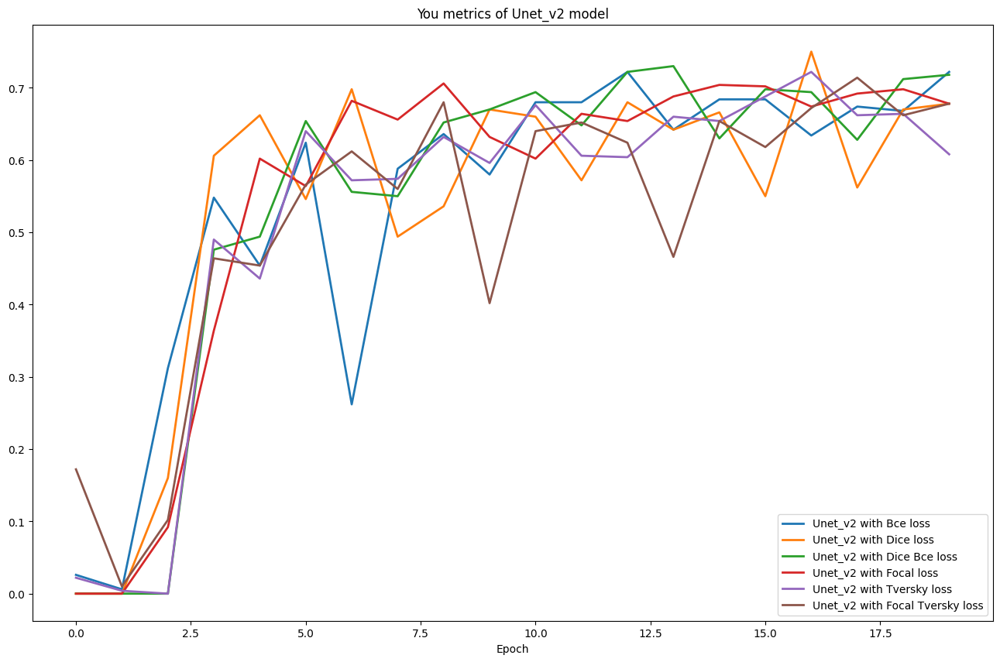

In [ ]:
plt.figure(figsize=(16, 10))
plt.title("You metrics of Unet_v2 model")
plt.plot(range(max_epochs), unet_v2_bce_iou_valid_scores, label="Unet_v2 with Bce loss", linewidth=2)
plt.plot(range(max_epochs), unet_v2_dice_iou_valid_scores, label="Unet_v2 with Dice loss", linewidth=2)
plt.plot(range(max_epochs), unet_v2_dice_bce_iou_valid_scores, label="Unet_v2 with Dice Bce loss", linewidth=2)
plt.plot(range(max_epochs), unet_v2_focal_iou_valid_scores, label="Unet_v2 with Focal loss", linewidth=2)
plt.plot(range(max_epochs), unet_v2_tversky_iou_valid_scores, label="Unet_v2 with Tversky loss", linewidth=2)
plt.plot(range(max_epochs), unet_v2_focal_tversky_iou_valid_scores, label="Unet_v2 with Focal Tversky loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

In [ ]:
tesing_results

,model,loss,val_loss_score,iou_test_score
0,segnet,bce_loss,0.130735,0.616
1,segnet,dice_loss,0.046342,0.570
2,segnet,dice_bce_loss,0.170536,0.658
3,segnet,focal_loss,0.043600,0.668
4,segnet,tversky_loss,0.060221,0.678
5,segnet,focal_tversky_loss,0.015734,0.702
6,unet_v1,bce_loss,0.139233,0.774
7,unet_v1,dice_loss,0.062220,0.742
8,unet_v1,dice_bce_loss,0.199492,0.676
9,unet_v1,focal_loss,0.056084,0.706


# Общий вывод

1. В тестировании приняли участие 3 модели: `SegNet`, `Unet_v1`, `Unet_v2`.
2. Качество моделей проверялось на 6 функциях потерь:
          * `bce_loss`,
          * `dice_loss`,
          * `dice_bce_loss`,
          * `focal_loss`,
          * `tversky_loss`,
          * `focal_tversky_loss`.
3. В частности установлено, что`SegNet` с функцией потерь `bce_loss` на 20-ти эпохах не переобучается.
4. На тесте, при 20-ти эпохах модель `Unet_v1` также, как и ранее, показывает немного лучшее качество (прирост порядка 8.5%), против - `Unet_v2`, при функции потерь: `bce_loss`.
5. Тройку лидеров возглавляют:

  * **model**..................**loss**.......................**score**
  1. `Unet_v1`.........`bce_loss`.................`0.774`
  2. `Unet_v2`......`dice_bce_loss`..........`0.750`
  2. `Unet_v1`...`focal_tversky_loss`...`0.750`


In [ ]:
pd.pivot_table(tesing_results, values='iou_test_score', index=['model', 'loss']).sort_values(by=['iou_test_score'], ascending=False)

iou_test_score
model   loss                              
unet_v1 bce_loss                     0.774
unet_v2 dice_bce_loss                0.750
unet_v1 focal_tversky_loss           0.750
        dice_loss                    0.742
unet_v2 dice_loss                    0.714
        bce_loss                     0.708
unet_v1 focal_loss                   0.706
segnet  focal_tversky_loss           0.702
unet_v2 focal_loss                   0.700
unet_v1 tversky_loss                 0.690
segnet  tversky_loss                 0.678
unet_v1 dice_bce_loss                0.676
segnet  focal_loss                   0.668
        dice_bce_loss                0.658
unet_v2 focal_tversky_loss           0.654
segnet  bce_loss                     0.616
unet_v2 tversky_loss                 0.580
segnet  dice_loss                    0.570